In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../')

import os
import json
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

/Mounts/rbg-storage1/users/urop/vincentf/miniconda3/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from data import ImageData

In [3]:
pred_path_new = '../output/bbox_detecit_twocat_no_mol/prediction_detect_test_twocat_no_mol.json'
image_base = '../data/detect/images/'
groundtruth_path = '../data/detect/splits/annotations/detect_test_twocat_no_mol.json'

    
with open(pred_path_new) as h:
    predictions_new = json.load(h)
    
with open (groundtruth_path) as g:
    groundtruth = json.load(g)

In [4]:
print(len(groundtruth['images']))

217


In [5]:
print(groundtruth['annotations'][0])

{'id': 838, 'image_id': 76, 'category_id': 3, 'segmentation': [], 'area': 575.3088, 'bbox': [269.68, 430.42, 20.43, 28.16], 'iscrowd': 0, 'attributes': {'occluded': False, 'rotation': 0.0}}


In [6]:
def prepare_for_coco_detection(predictions):
        img_ids = []
        coco_results = []
        for idx, prediction in enumerate(predictions):
            if len(prediction) == 0:
                continue

            image = coco_gt.dataset['images'][idx]
            img_ids.append(image['id'])
            width = image['width']
            height = image['height']

            coco_results.extend(
                [
                    {
                        "image_id": image['id'],
                        "category_id": pred['category_id'],
                        "bbox": convert_to_xywh(pred['bbox'], width, height),
                        "score": pred['score'],
                    }
                    for pred in prediction
                ]
            )
        return img_ids, coco_results
def convert_to_xywh(box, width, height):
    xmin, ymin, xmax, ymax = box
    return [xmin * width, ymin * height, (xmax - xmin) * width, (ymax - ymin) * height]

In [7]:
print(predictions_new['bbox'][0])


[{'category': '[Mol]', 'bbox': [0.02451225612806403, 0.00417890234284555, 0.41870935467733866, 0.13312788892207966], 'category_id': 1, 'score': -1.1920928244535389e-07}, {'category': '[Mol]', 'bbox': [0.5927963981990996, 0.20476621479943194, 0.9714857428714357, 0.35401272704391584], 'category_id': 1, 'score': 0.0}, {'category': '[Mol]', 'bbox': [0.015007503751875938, 0.2107360752892113, 0.40070035017508754, 0.35580368519084965], 'category_id': 1, 'score': 0.0}, {'category': '[Mol]', 'bbox': [0.6028014007003502, 0.003581916293867614, 0.9804902451225613, 0.1307399447261679], 'category_id': 1, 'score': 0.0}, {'category': '[Idt]', 'bbox': [0.19459729864932465, 0.37550422480712153, 0.21960980490245122, 0.40833845750090797], 'category_id': 3, 'score': -1.1920928244535389e-07}, {'category': '[Idt]', 'bbox': [0.768384192096048, 0.3743102527091657, 0.7943971985992997, 0.4071444854029521], 'category_id': 3, 'score': 0.0}, {'category': '[Idt]', 'bbox': [0.2096048024012006, 0.13014295867718997, 0.

In [11]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
ap = 0
bad = set()
def display_single_image(num, ap):
    file_name = predictions_new['file_name'][num]
    #print(file_name)
    
    #print("the prediction is")
    #print(predictions_new['bbox'][predictions_new['file_name'].index(file_name)])
    
    single_gt = {}
    single_gt['categories'] = groundtruth['categories']
    single_gt['images'] = []
    single_gt['annotations'] = []
    
    single_pred = []
    '''
    single_pred['categories'] = groundtruth['categories']
    single_pred['images'] = []
    single_pred['annotations'] = predictions_new['bbox'][num]
    '''

    
    for image in groundtruth['images']:
        if image['file_name'] == file_name:
            #print("the ground truth is")
            #print(image)
            single_gt['images'].append(image)
            #single_pred['images'].append(image)
            gt_num = image['id']
            
            width = image['width']
            height = image['height']
            single_pred.extend(
                [
                    {
                        "image_id": image['id'],
                        "category_id": pred['category_id'],
                        "bbox": convert_to_xywh(pred['bbox'], width, height),
                        "score": pred['score'],
                    }

                    for pred in predictions_new['bbox'][num]
                ]
            )
            print("-------")
            print(single_pred)
    print("gt_num")
    print(gt_num)
    for annotation in groundtruth['annotations']:
        if annotation['image_id'] == gt_num:
            single_gt['annotations'].append(annotation)
    print("the ground truth annotations are")
    print(single_gt)


    image_file = image_base + file_name
    img = cv2.imread(image_file)
    #d = ImageData(predictions=predictions['bbox'][i], image_file=image_file)
    #ig, ax = plt.subplots(figsize=(10, 10))
    #d.draw_prediction(ax, img)
    #plt.show()
    ddd = ImageData(predictions=predictions_new['bbox'][predictions_new['file_name'].index(file_name)], image_file=image_file)
    ig, ax = plt.subplots(figsize=(10, 10))
    ddd.draw_prediction(ax, img)
    plt.show()
    save = None
    for image in groundtruth['images']:
        if image['file_name'] == file_name:
            save = image
            break
            
    dd = ImageData(save)

    ig, ax = plt.subplots(figsize=(10, 10))
    dd.draw_gold(ax, img)
    plt.show()
    print(num)
    return ap
            

-------
[{'image_id': 1643, 'category_id': 3, 'bbox': [4.034017008504252, 108.26949838555642, 113.5287643821911, 65.6527809359225], 'score': -1.1920928244535389e-07}, {'image_id': 1643, 'category_id': 3, 'bbox': [5.186593296648324, 433.07799354222567, 105.4607303651826, 65.07687934876529], 'score': 0.0}, {'image_id': 1643, 'category_id': 3, 'bbox': [670.2231115557779, 548.8342125608258, 119.29164582291143, 57.01425712856427], 'score': 0.0}, {'image_id': 1643, 'category_id': 1, 'bbox': [563.6098049024512, 321.92898722088313, 301.39869934967487, 231.51243803720047], 'score': 0.0}, {'image_id': 1643, 'category_id': 3, 'bbox': [902.4672336168085, 207.90047296375462, 112.37618809404698, 55.286552367092604], 'score': 0.0}, {'image_id': 1643, 'category_id': 1, 'bbox': [707.6818409204603, 4.031311110100504, 435.67383691845913, 205.59686661512575], 'score': 0.0}]
gt_num
1643
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': '

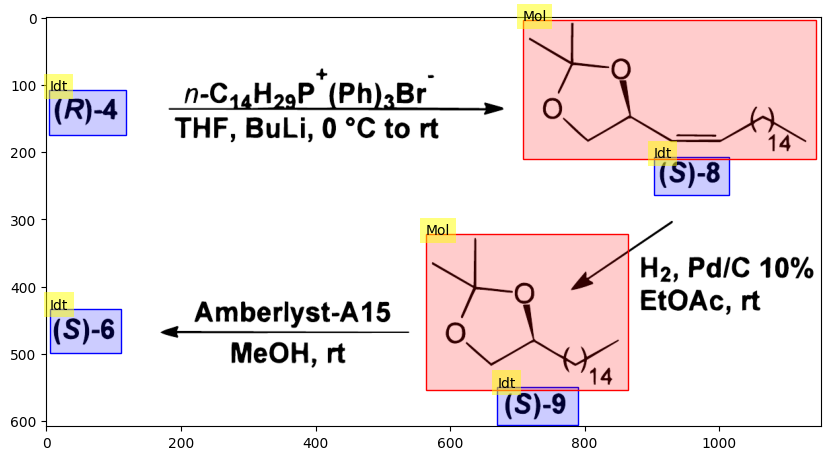

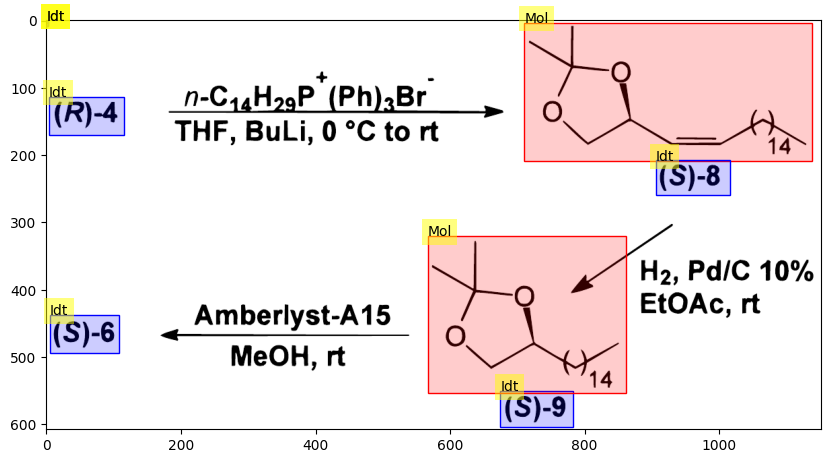

170
-------
[{'image_id': 1648, 'category_id': 3, 'bbox': [322.50525262631317, 318.07953976988495, 95.2856428214107, 46.01150575287645], 'score': -7.510157047363464e-06}, {'image_id': 1648, 'category_id': 1, 'bbox': [766.9494747373687, 4.001000500250125, 344.49424712356176, 306.74337168584293], 'score': -1.1920928244535389e-07}, {'image_id': 1648, 'category_id': 1, 'bbox': [193.90295147573786, 2.6673336668334167, 380.47623811905953, 310.0775387693847], 'score': 0.0}]
gt_num
1648
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1648, 'width': 1332, 'height': 364, 'file_name': 'jo9717245-Scheme-c2.png', 'license': 0, 'bboxes': [{'bbox': [322.51, 318.08, 92.62, 45.34], 'category_id': 3, 'id': 18240}, {'bbox': [766.95, 0.0, 345.83, 309.5], 'category_id': 1, 'id': 18241}, {'bbox': [0.0, 149.37, 43.31, 52.68], 'category_id': 3, 'id': 18242}, {'bbox': [854.88, 314.14, 

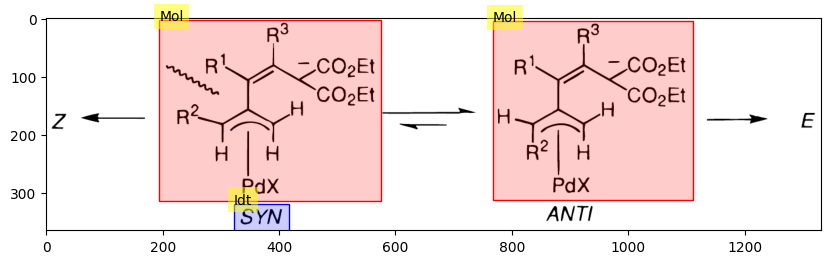

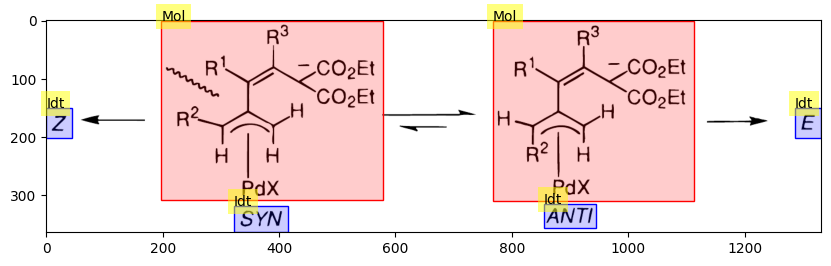

171
-------
[{'image_id': 1664, 'category_id': 3, 'bbox': [0.0, 319.16004948582076, 69.97298649324662, 61.86616901265005], 'score': -1.1920922133867862e-06}, {'image_id': 1664, 'category_id': 3, 'bbox': [1086.0270135067533, 150.90719731123048, 64.19009504752383, 58.97522653542339], 'score': 0.0}, {'image_id': 1664, 'category_id': 3, 'bbox': [1088.3401700850425, 497.8202945784269, 63.61180590295145, 60.709792021759384], 'score': 0.0}, {'image_id': 1664, 'category_id': 1, 'bbox': [357.96098049024516, 433.6413715839956, 364.32216108054024, 206.41329287398196], 'score': -1.1920928244535389e-07}, {'image_id': 1664, 'category_id': 3, 'bbox': [159.60780390195097, 323.20736895393804, 64.19009504752377, 54.927907067306144], 'score': 0.0}, {'image_id': 1664, 'category_id': 1, 'bbox': [836.7843921960981, 5.203696459007947, 254.4472236118058, 714.6409803704247], 'score': 0.0}, {'image_id': 1664, 'category_id': 1, 'bbox': [352.75637818909456, 97.71385573026033, 424.4642321160581, 279.84323179553843

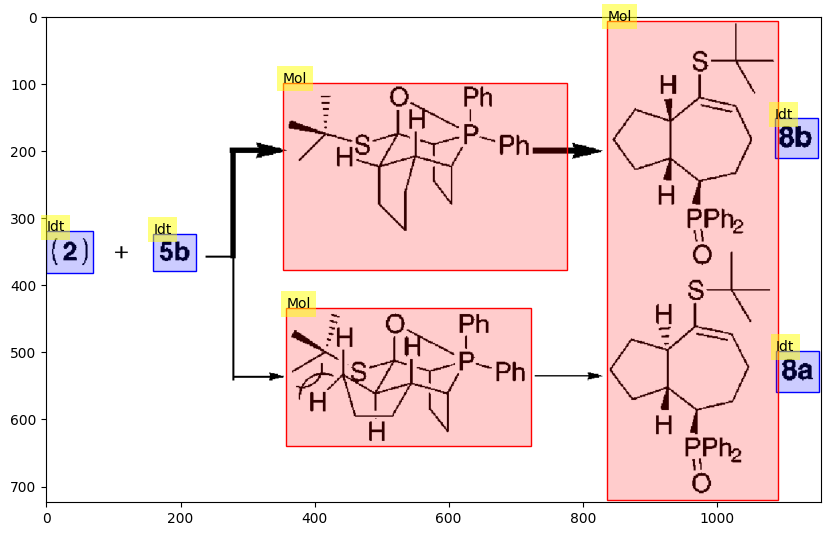

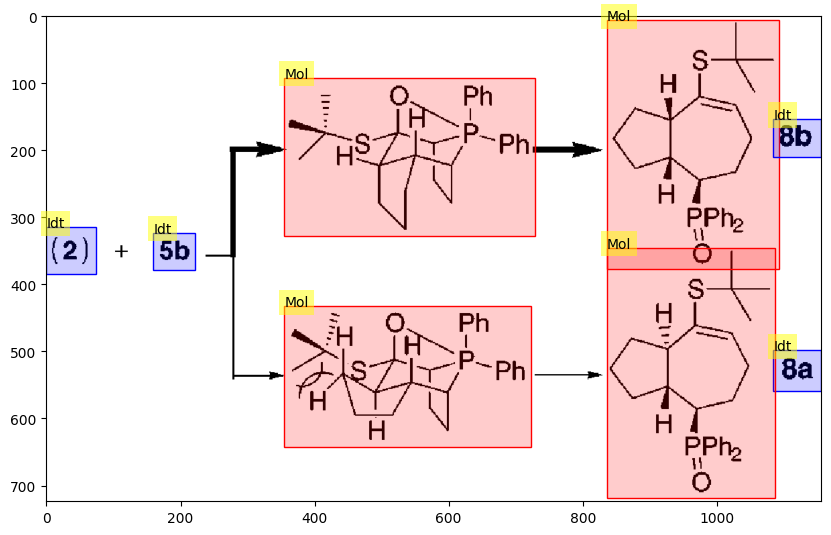

172
-------
[{'image_id': 1679, 'category_id': 1, 'bbox': [1017.8889444722361, 0.0, 325.99499749874934, 329.3020512413704], 'score': 0.0}, {'image_id': 1679, 'category_id': 1, 'bbox': [522.8094047023511, 0.0, 300.9704852426213, 332.0067908819566], 'score': 0.0}, {'image_id': 1679, 'category_id': 1, 'bbox': [8.116058029014507, 0.0, 348.31415707853927, 329.9782361515169], 'score': 0.0}, {'image_id': 1679, 'category_id': 3, 'bbox': [610.0570285142571, 818.8599261874733, 35.16958479239618, 39.21872478850002], 'score': -1.1920928244535389e-07}, {'image_id': 1679, 'category_id': 3, 'bbox': [126.4752376188094, 817.5075563671802, 35.1695847923962, 39.894909698646536], 'score': -1.1920928244535389e-07}, {'image_id': 1679, 'category_id': 1, 'bbox': [524.1620810405202, 534.1860790157754, 301.64682341170584, 329.30205124137035], 'score': 0.0}, {'image_id': 1679, 'category_id': 3, 'bbox': [582.3271635817908, 357.70181746752553, 169.08454227113558, 83.84692885817233], 'score': 0.0}, {'image_id': 167

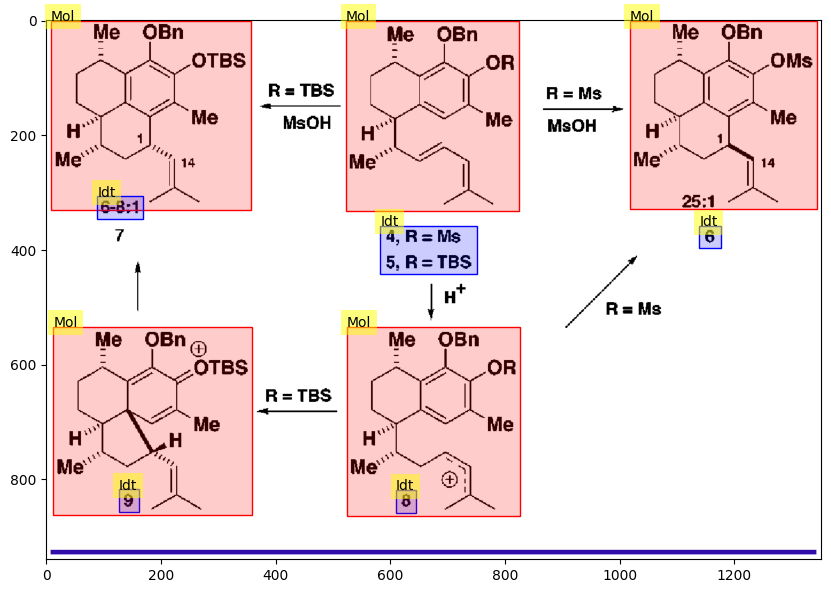

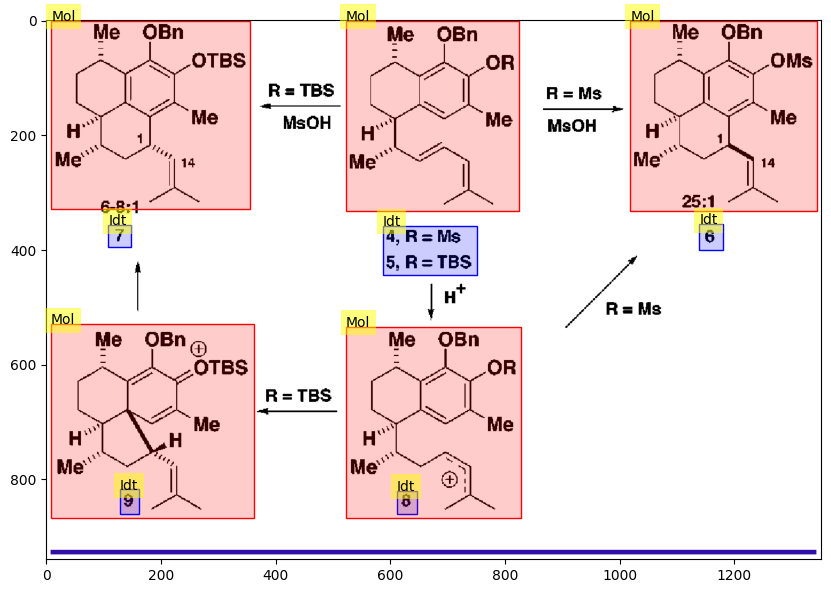

173
-------
[{'image_id': 1741, 'category_id': 3, 'bbox': [938.0810405202601, 580.2394357556137, 58.84142071035521, 49.36769092093209], 'score': 0.0}, {'image_id': 1741, 'category_id': 1, 'bbox': [1029.3866933466734, 522.0802382323237, 208.31215607803895, 192.06060577458538], 'score': 0.0}, {'image_id': 1741, 'category_id': 1, 'bbox': [8.79239619809905, 0.0, 355.75387693846926, 409.8194616176012], 'score': 0.0}, {'image_id': 1741, 'category_id': 3, 'bbox': [1153.1565782891446, 382.0924023332421, 66.28114057028509, 48.69142118228922], 'score': 0.0}, {'image_id': 1741, 'category_id': 3, 'bbox': [173.8189094547274, 392.9127181515285, 47.34367183591794, 45.31007248907477], 'score': 0.0}, {'image_id': 1741, 'category_id': 3, 'bbox': [1105.136568284142, 715.4933834841949, 58.84142071035521, 50.72023039821792], 'score': 0.0}, {'image_id': 1741, 'category_id': 1, 'bbox': [999.6278139069534, 12.172855295572313, 338.16908454227115, 369.91954703766976], 'score': 0.0}, {'image_id': 1741, 'category

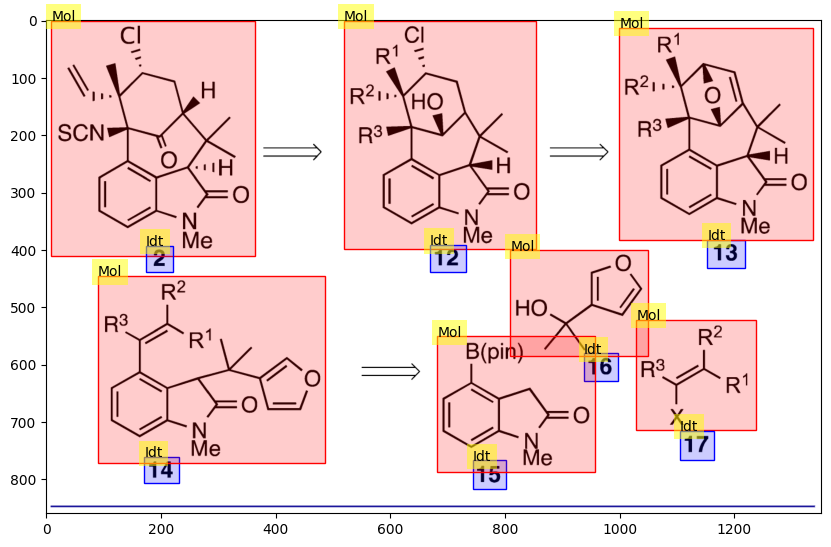

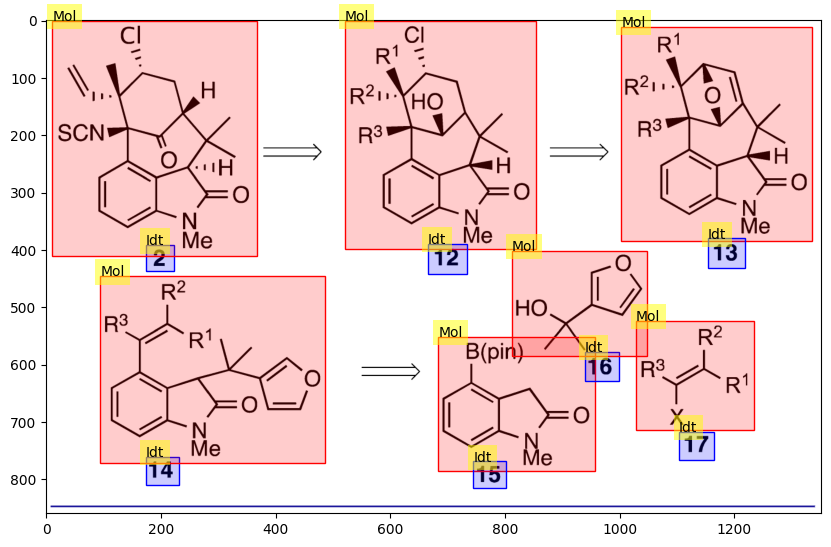

174
-------
[{'image_id': 1846, 'category_id': 1, 'bbox': [110.2431215607804, 45.31066949905548, 173.14257128564284, 60.18879978232743], 'score': 0.0}, {'image_id': 1846, 'category_id': 1, 'bbox': [898.1770885442722, 0.0, 340.19809904952467, 163.65943311599145], 'score': 0.0}, {'image_id': 1846, 'category_id': 3, 'bbox': [177.20060030015009, 157.57292527283474, 45.99099549774888, 50.04462004373291], 'score': 0.0}, {'image_id': 1846, 'category_id': 3, 'bbox': [403.0975487743872, 622.8526359497029, 40.58029014507251, 45.98694814829511], 'score': 0.0}, {'image_id': 1846, 'category_id': 3, 'bbox': [483.58179089544774, 156.89664662359507, 50.0490245122561, 50.04462004373291], 'score': 0.0}, {'image_id': 1846, 'category_id': 1, 'bbox': [352.37218609304654, 451.0778590428358, 308.4102051025513, 173.1273342053464], 'score': 0.0}, {'image_id': 1846, 'category_id': 3, 'bbox': [979.3376688344172, 622.1763573004632, 39.903951975988015, 46.663226797534755], 'score': -1.1920928244535389e-07}, {'imag

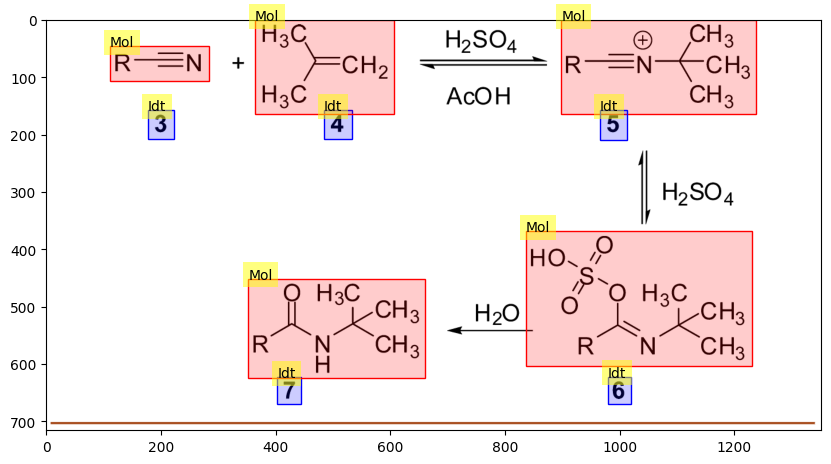

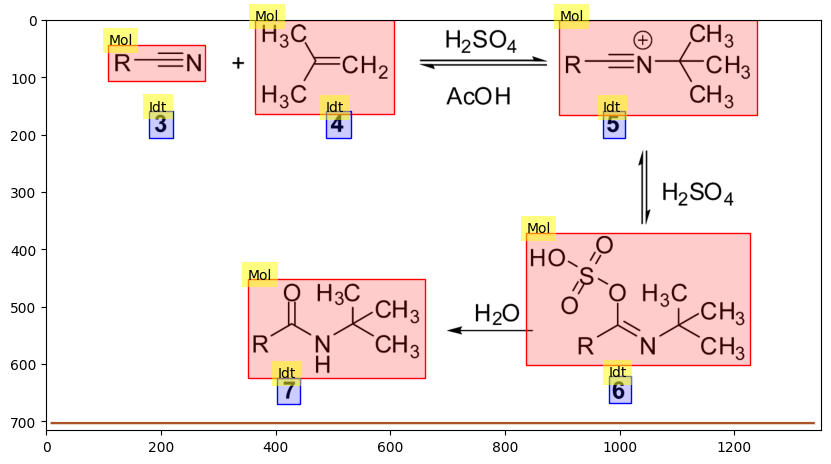

175
-------
[]
gt_num
1927
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1927, 'width': 818, 'height': 1088, 'file_name': 'op8001799-Figure-c6.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 6. RC1 heat output, gas evolution, and methanol addition vs time for reduction of ester 5 with NaB(OMe)nH4-n/ NaB(OAc)3H using initial process conditions: delayed onset accompanied with sharp release of heat and hydrogen.8 '}], 'annotations': []}


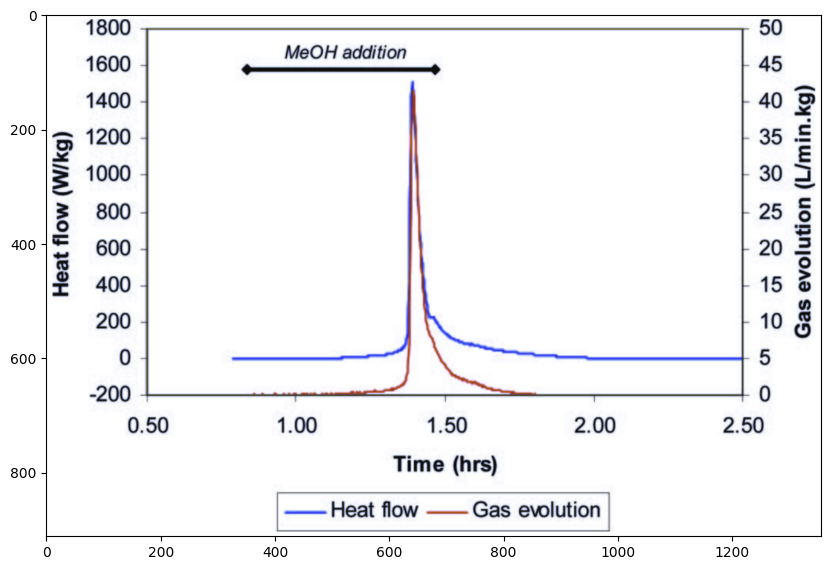

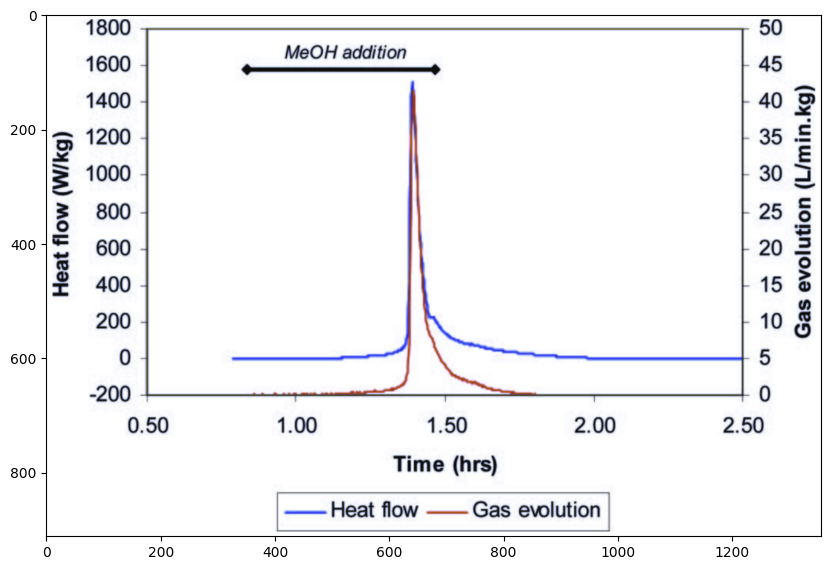

176
-------
[]
gt_num
1929
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1929, 'width': 869, 'height': 1137, 'file_name': 'acs.joc.5b02237-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. UV−vis spectra of diarylethene 3k before and after irradiation with UV light (λ = 365 nm) for 10 s in acetonitrile (c = 1.1 × 10−3 M) and thermal decomposition of colored intermediate 15 observed at 525 nm (inset). '}], 'annotations': []}


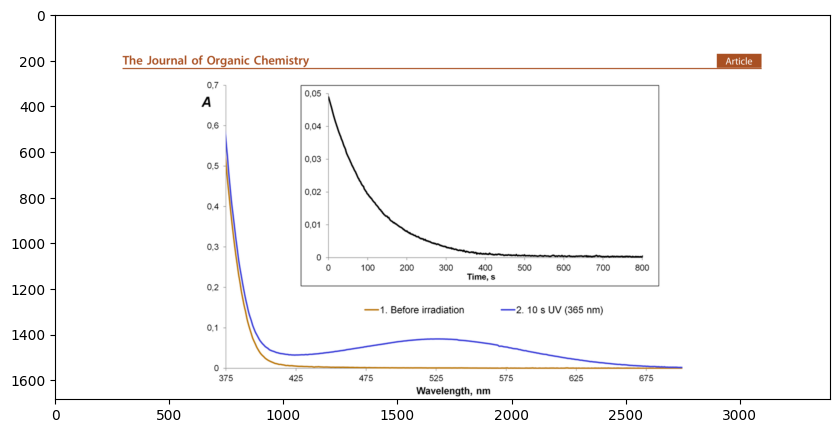

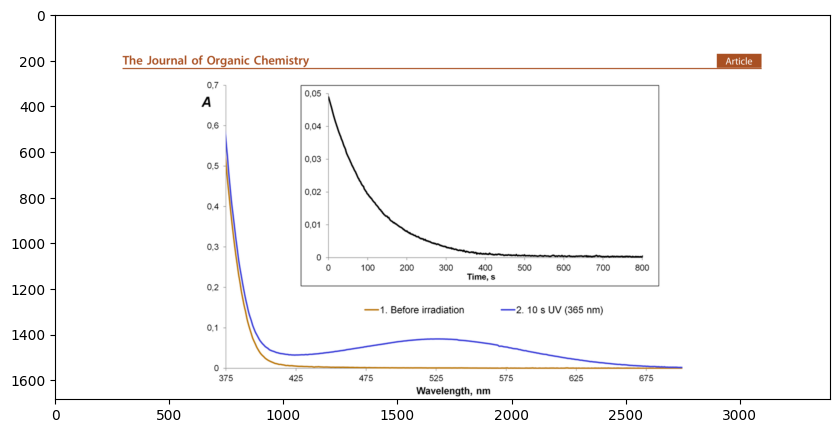

177
-------
[]
gt_num
1930
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1930, 'width': 844, 'height': 1112, 'file_name': 'op200251c-Figure-c6.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 6. Heat ﬂow of the semibatch-type operation of the reaction in DMA/H2O. '}], 'annotations': []}


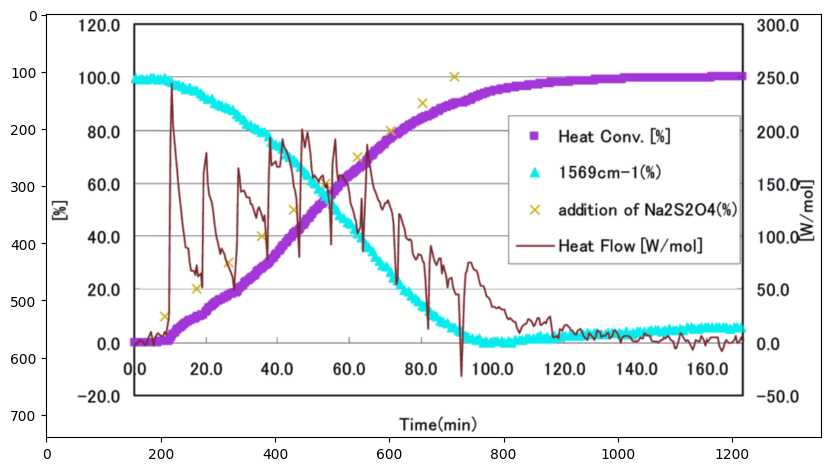

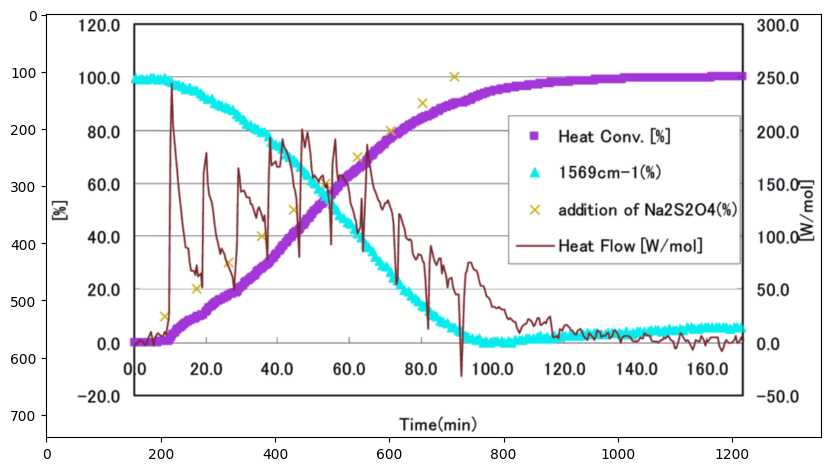

178
-------
[]
-------
[]
gt_num
1937
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1936, 'width': 869, 'height': 1137, 'file_name': 'acs.orglett.5b01385-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Heterogeneous CHCl3 hydrolysis. Conditions: Base (1.33 mmol), CHCl3 (0.40 mmol), PhMe (0.80 mL), 80 °C. See Supporting Information for more details. '}, {'id': 1937, 'width': 869, 'height': 1137, 'file_name': 'acs.orglett.5b01385-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Optimization of the Reaction Conditionsa'}], 'annotations': []}


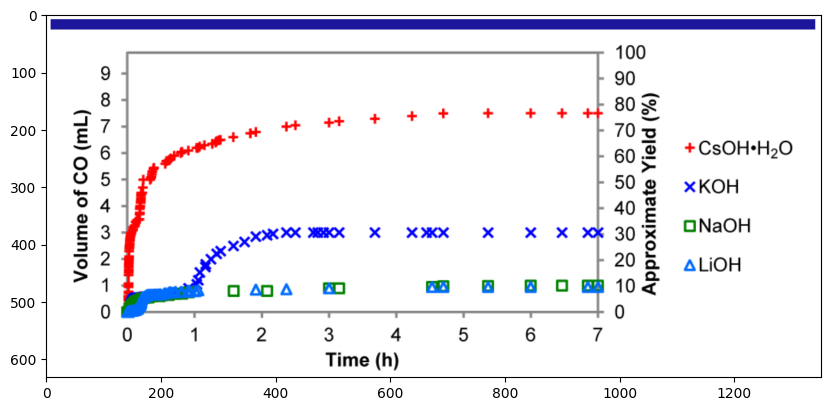

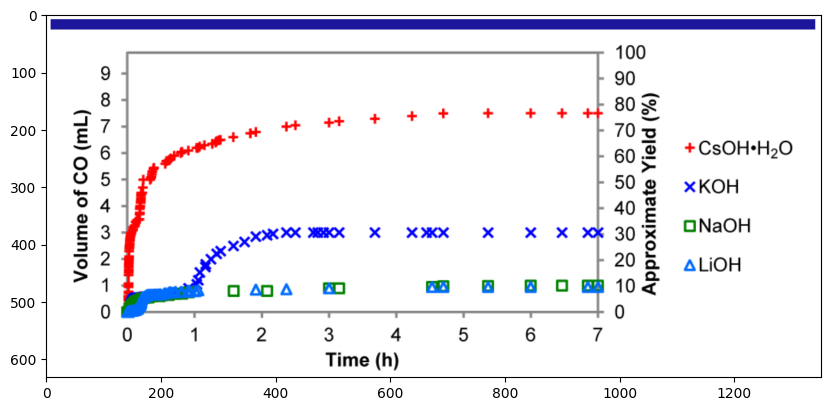

179
-------
[]
-------
[]
gt_num
1937
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1936, 'width': 869, 'height': 1137, 'file_name': 'acs.orglett.5b01385-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Heterogeneous CHCl3 hydrolysis. Conditions: Base (1.33 mmol), CHCl3 (0.40 mmol), PhMe (0.80 mL), 80 °C. See Supporting Information for more details. '}, {'id': 1937, 'width': 869, 'height': 1137, 'file_name': 'acs.orglett.5b01385-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Optimization of the Reaction Conditionsa'}], 'annotations': []}


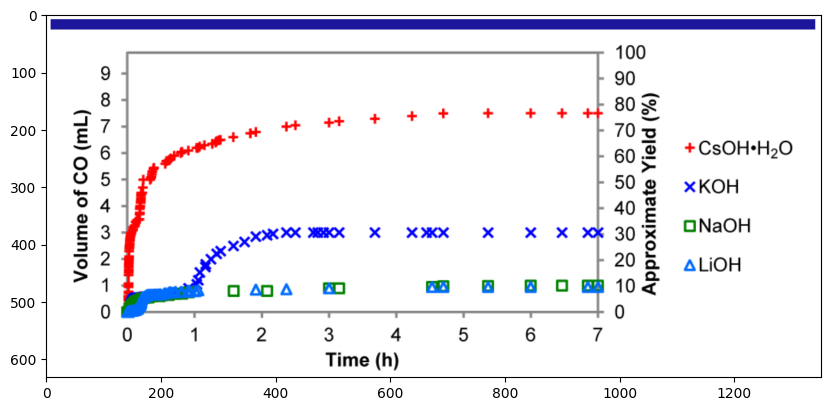

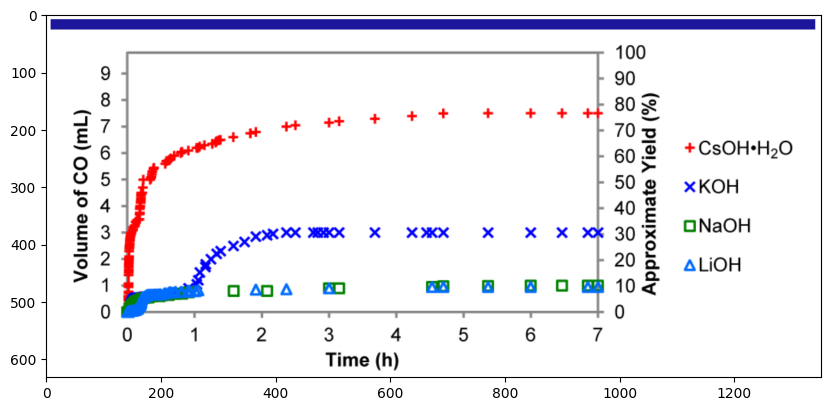

180
-------
[]
-------
[]
gt_num
1957
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1956, 'width': 850, 'height': 1100, 'file_name': 'op049803n-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. Summary of key kernel relationships among reaction metrics for a single general chemical reaction under conditions where the solvent and any catalysts are recycled. Group A refers to the set of expressions under stoichiometric conditions (SF ) 1), and group B refers to the set of expressions under nonstoichiometric conditions (SF > 1). Symbols are defined in text. '}, {'id': 1957, 'width': 850, 'height': 1100, 'file_name': 'op049803n-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Effect of recycling toluene and/or triethylamine on 

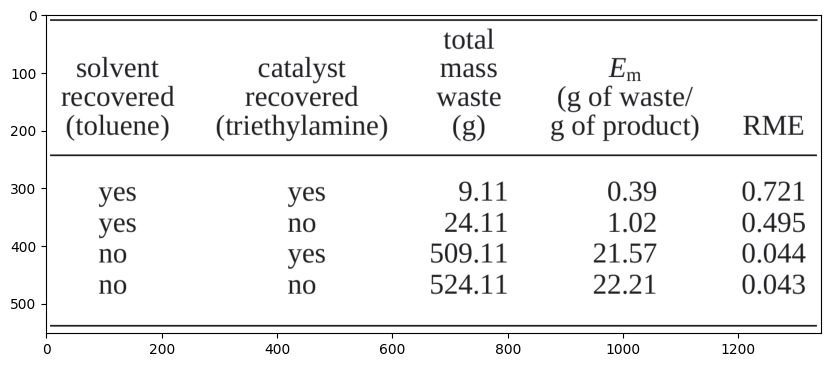

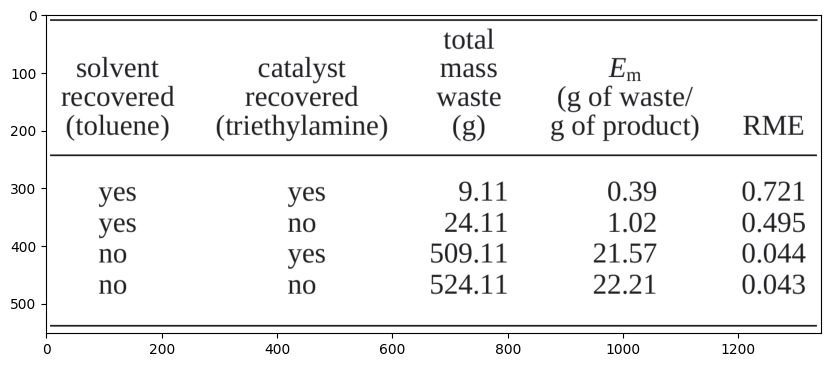

181
-------
[]
-------
[]
gt_num
1957
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1956, 'width': 850, 'height': 1100, 'file_name': 'op049803n-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. Summary of key kernel relationships among reaction metrics for a single general chemical reaction under conditions where the solvent and any catalysts are recycled. Group A refers to the set of expressions under stoichiometric conditions (SF ) 1), and group B refers to the set of expressions under nonstoichiometric conditions (SF > 1). Symbols are defined in text. '}, {'id': 1957, 'width': 850, 'height': 1100, 'file_name': 'op049803n-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Effect of recycling toluene and/or triethylamine on 

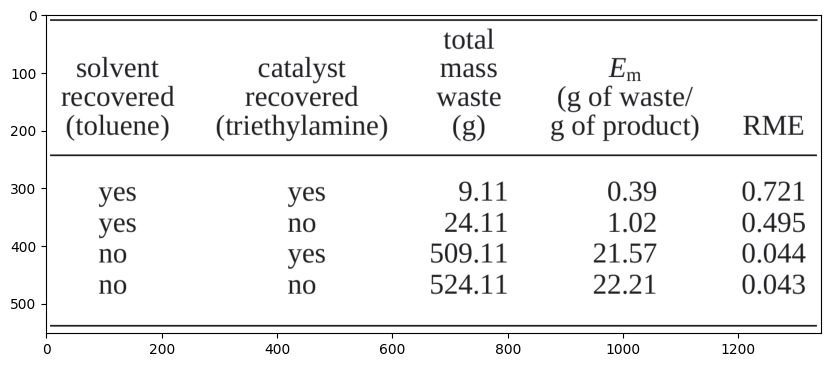

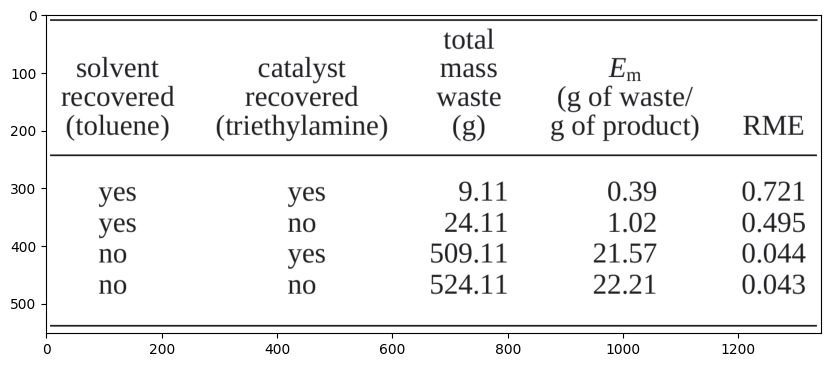

182
-------
[]
gt_num
1970
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1970, 'width': 850, 'height': 1100, 'file_name': 'ol0167661-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. Upfield and downfield regions of the 1H NMR spectra ([4b]) 4 mM, 295 K, 600 MHz): (a) 4b in CD2Cl2; (b) 4b‚5+ in CD3OD; (c) as in (b) after the addition of 1 molar equiv of La- (OTf)3; (d) as in (b) after the addition of 2 equiv of La(OTf)3. Asterisks represent methine bridges. Protons of the resorcinol rings: (9) at 5-positions; (1) at 2-positions; (b) the protons of the cavitand walls. '}], 'annotations': []}


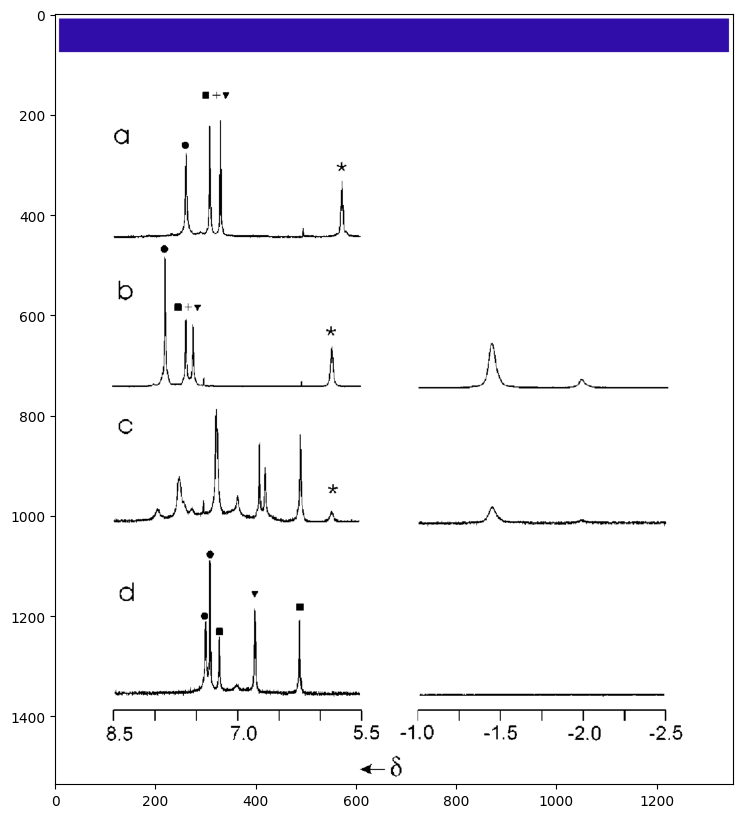

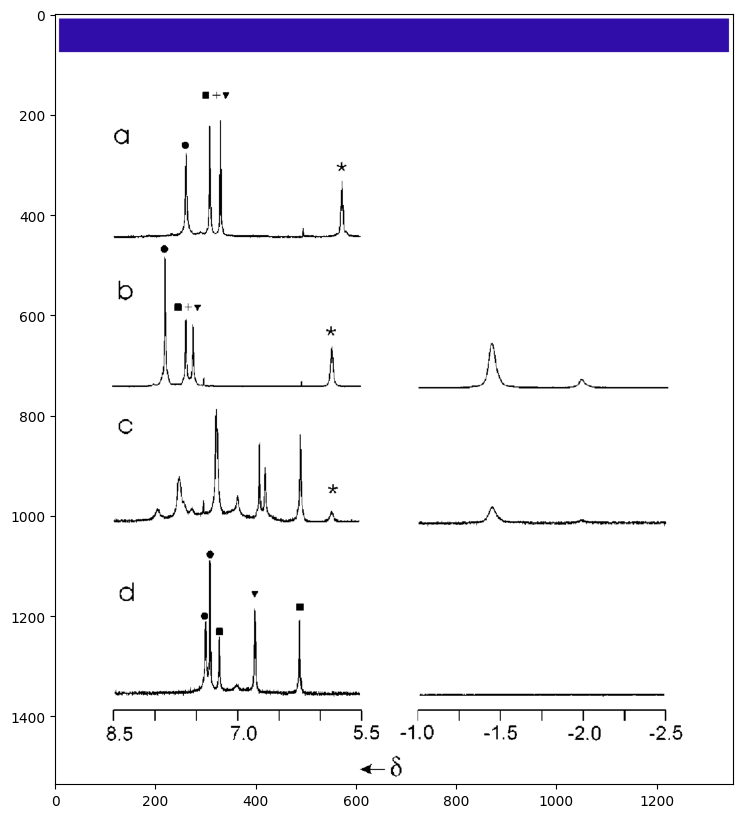

183
-------
[]
-------
[]
gt_num
1972
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1971, 'width': 818, 'height': 1088, 'file_name': 'ol802141g-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Yields of the Formation and the Hydrolytic Stability of Acetals 6a-d; Quantum and Chemical Efficiencies of Photochemical Release of Glycols 5a-d '}, {'id': 1972, 'width': 818, 'height': 1088, 'file_name': 'ol802141g-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. UV spectra of 6b (solid line, ca. 1 × 10-4 M in 20% aqueous methanol) and its 300 nm photolysis (dashed lines, every 4 min). '}], 'annotations': []}


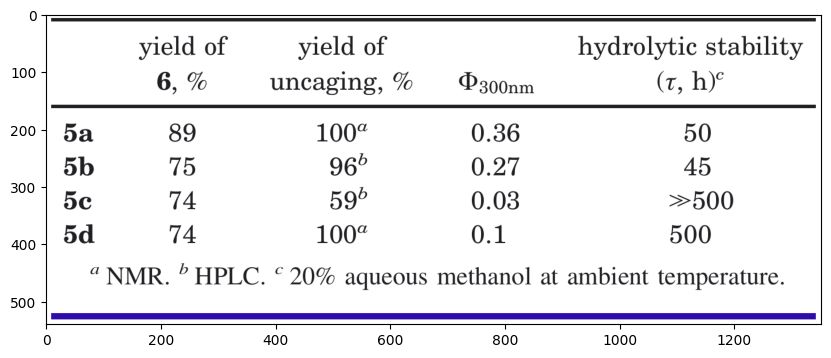

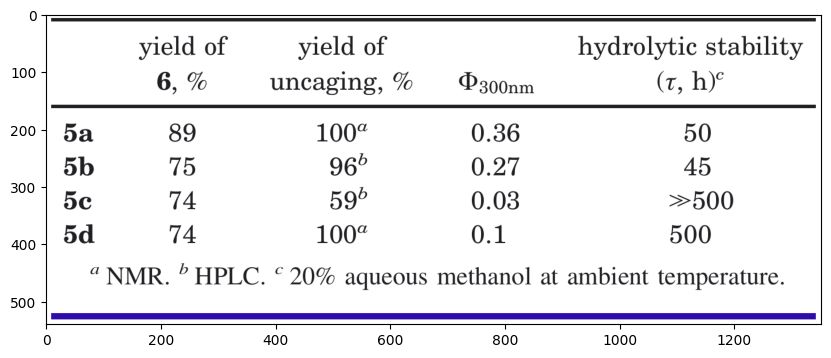

184
-------
[]
-------
[]
gt_num
1972
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1971, 'width': 818, 'height': 1088, 'file_name': 'ol802141g-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Yields of the Formation and the Hydrolytic Stability of Acetals 6a-d; Quantum and Chemical Efficiencies of Photochemical Release of Glycols 5a-d '}, {'id': 1972, 'width': 818, 'height': 1088, 'file_name': 'ol802141g-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. UV spectra of 6b (solid line, ca. 1 × 10-4 M in 20% aqueous methanol) and its 300 nm photolysis (dashed lines, every 4 min). '}], 'annotations': []}


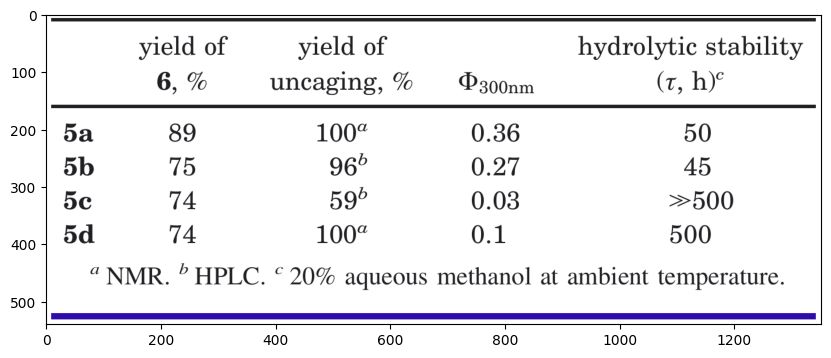

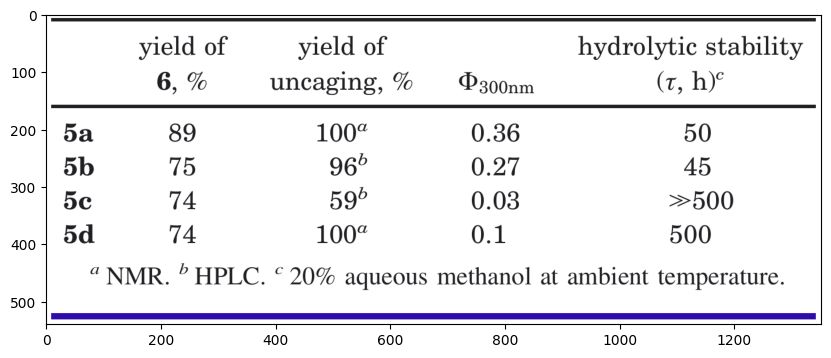

185
-------
[]
-------
[]
gt_num
1974
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1973, 'width': 869, 'height': 1137, 'file_name': 'op400013e-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. pH optima for D-amino acid dehydrogenases. (▲) In-house D-AADH; (⧫) D-AADH-102. '}, {'id': 1974, 'width': 869, 'height': 1137, 'file_name': 'op400013e-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Fractionation of cell extract enzyme activities by chromatography on Q-Sepharose '}], 'annotations': []}


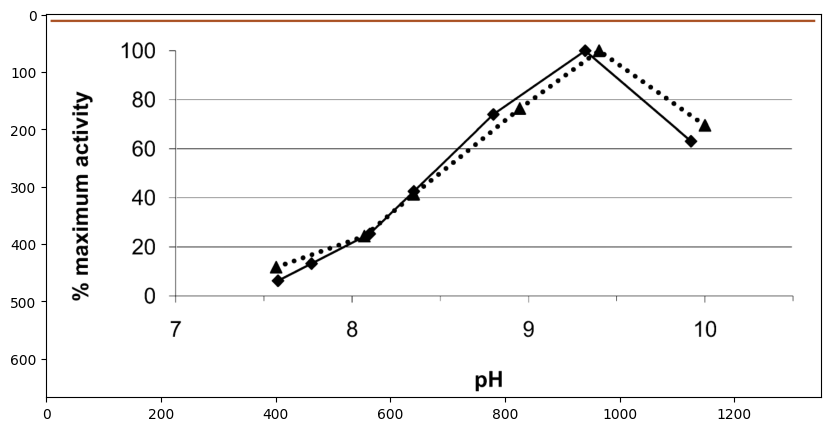

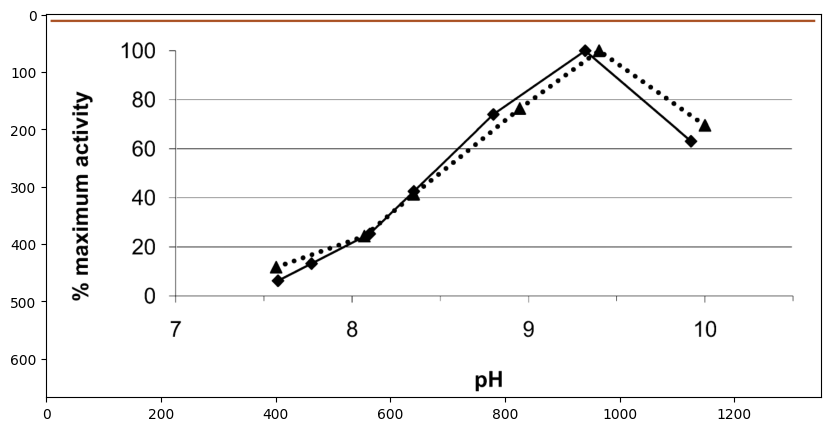

186
-------
[]
-------
[]
gt_num
1974
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1973, 'width': 869, 'height': 1137, 'file_name': 'op400013e-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. pH optima for D-amino acid dehydrogenases. (▲) In-house D-AADH; (⧫) D-AADH-102. '}, {'id': 1974, 'width': 869, 'height': 1137, 'file_name': 'op400013e-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Fractionation of cell extract enzyme activities by chromatography on Q-Sepharose '}], 'annotations': []}


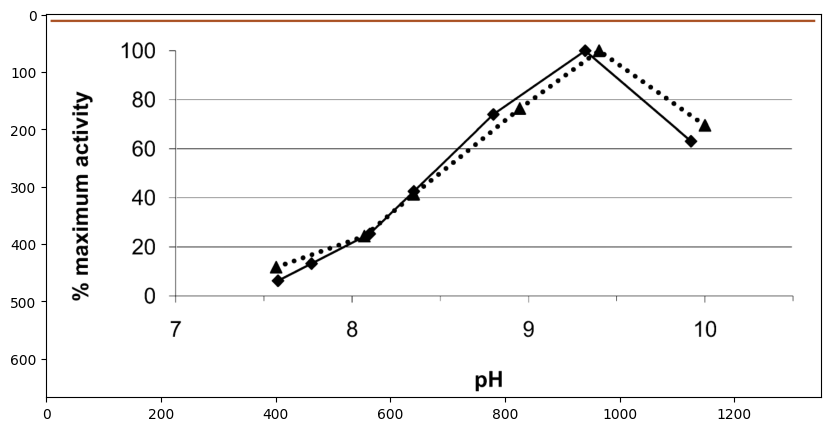

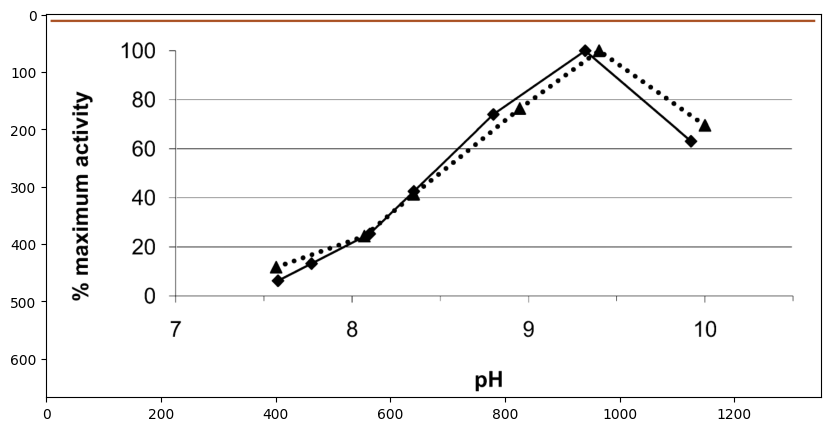

187
-------
[]
gt_num
1975
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1975, 'width': 850, 'height': 1100, 'file_name': 'jo0056489-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': '      Table 2. Formation of 6a-c in the Presence of (i-Pr)3SiOTf and Yields of Trapping Reactions Leading to                         9b and 9c '}], 'annotations': []}


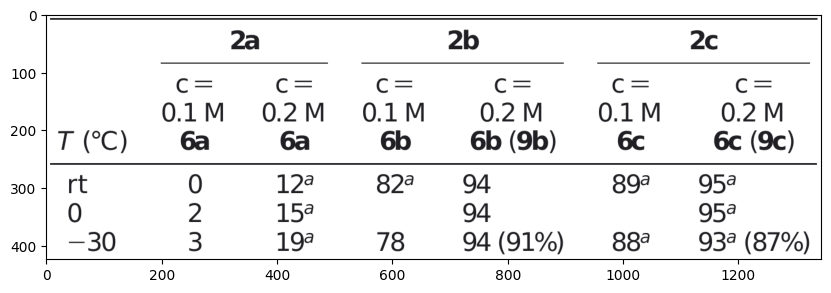

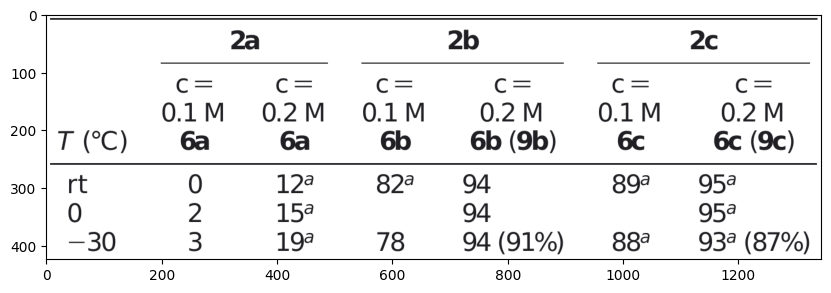

188
-------
[]
-------
[]
gt_num
1994
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1993, 'width': 869, 'height': 1137, 'file_name': 'jo5007575-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 3. Average initial rate constants (s−1) for the decomposition of 1 in 1,4-dioxane/H2O mixtures measured at 240 nm. '}, {'id': 1994, 'width': 869, 'height': 1137, 'file_name': 'jo5007575-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 3. Decomposition Rate Constants (s−1) for 1 in Various Solvent Mixtures Purged with CO2'}], 'annotations': []}


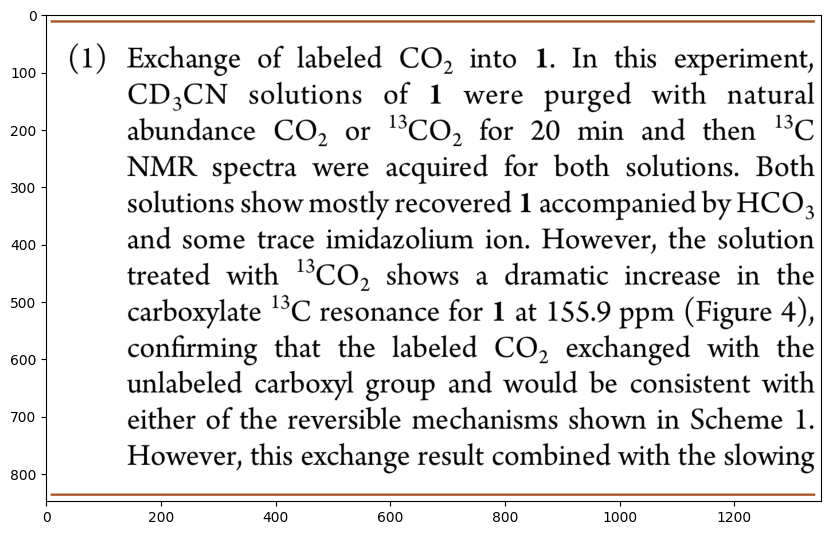

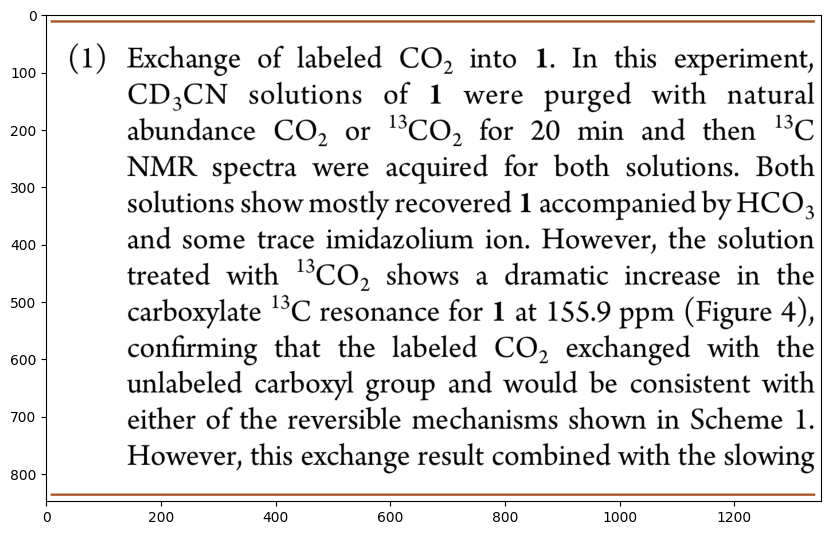

189
-------
[]
-------
[]
gt_num
1994
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1993, 'width': 869, 'height': 1137, 'file_name': 'jo5007575-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 3. Average initial rate constants (s−1) for the decomposition of 1 in 1,4-dioxane/H2O mixtures measured at 240 nm. '}, {'id': 1994, 'width': 869, 'height': 1137, 'file_name': 'jo5007575-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 3. Decomposition Rate Constants (s−1) for 1 in Various Solvent Mixtures Purged with CO2'}], 'annotations': []}


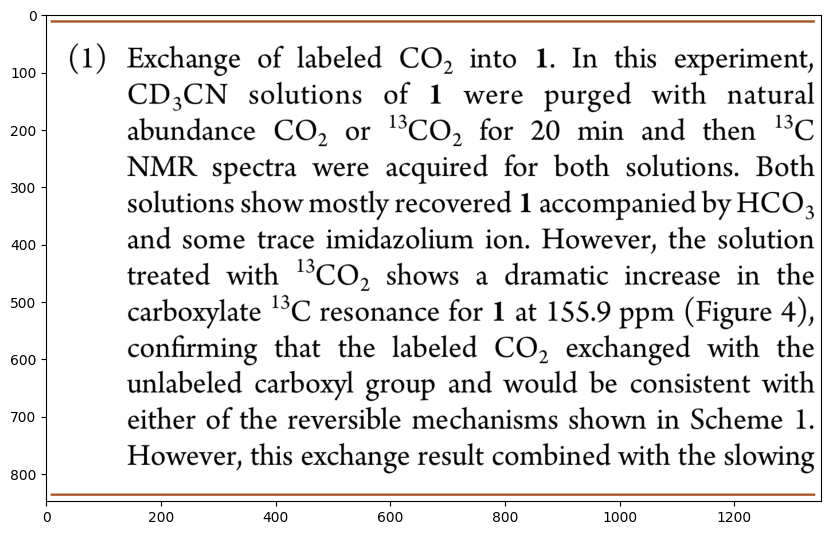

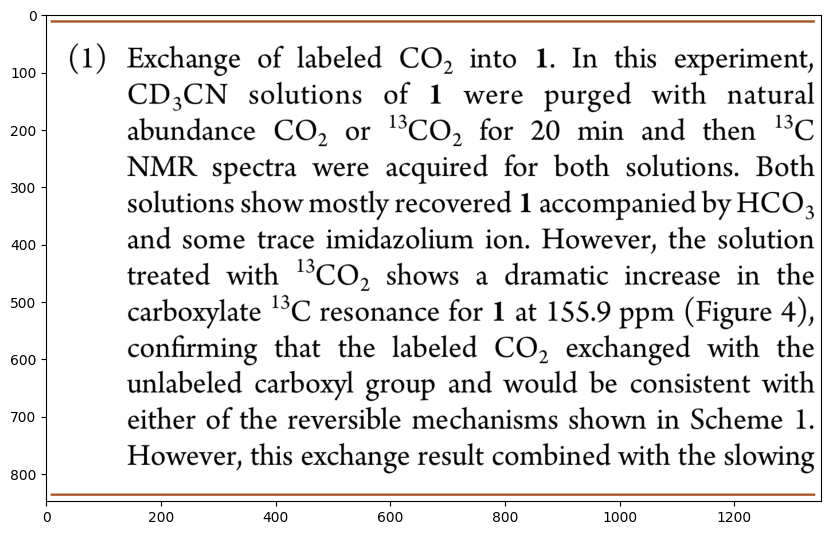

190
-------
[]
gt_num
1999
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 1999, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00137-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Features and Beneﬁts of the SiliaCat Catalyst Series'}], 'annotations': []}


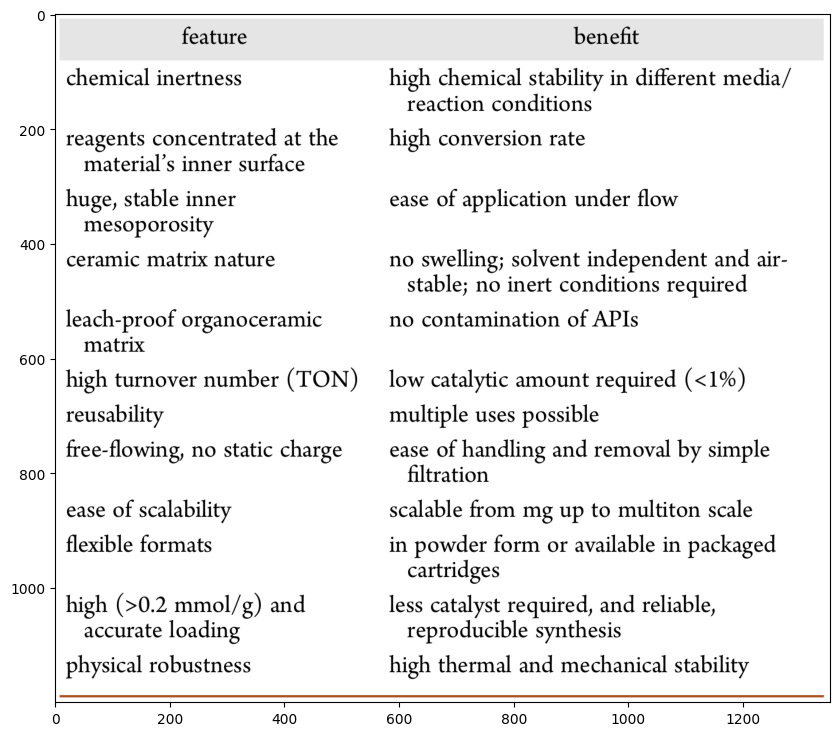

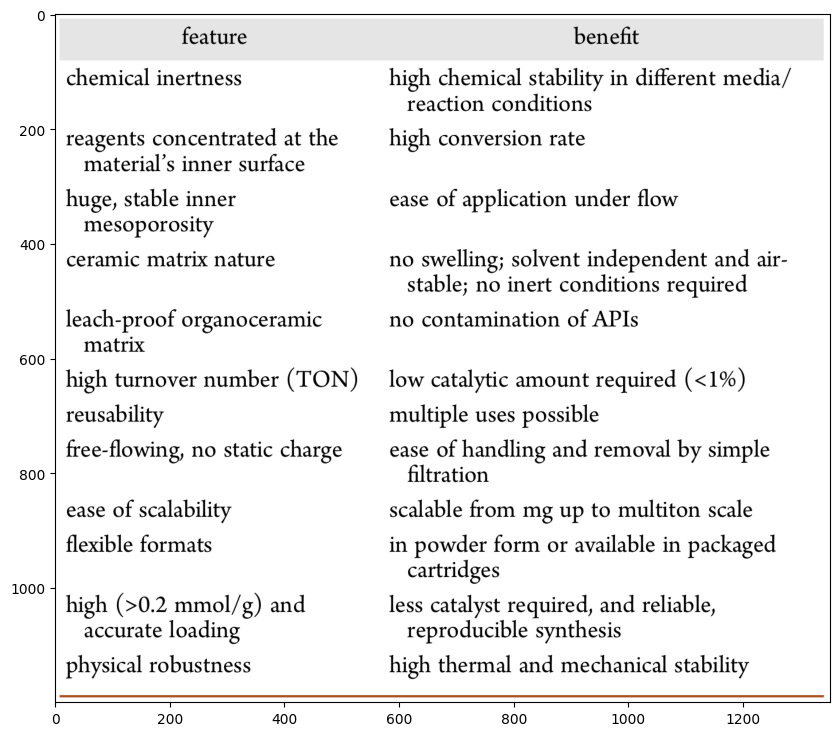

191
-------
[]
-------
[]
gt_num
2014
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2013, 'width': 818, 'height': 1088, 'file_name': 'ol8019605-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Borylation of Sterically Hindered m-Terphenylsa'}, {'id': 2014, 'width': 818, 'height': 1088, 'file_name': 'ol8019605-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Absorbance and emission spectra of dendrons.'}], 'annotations': []}


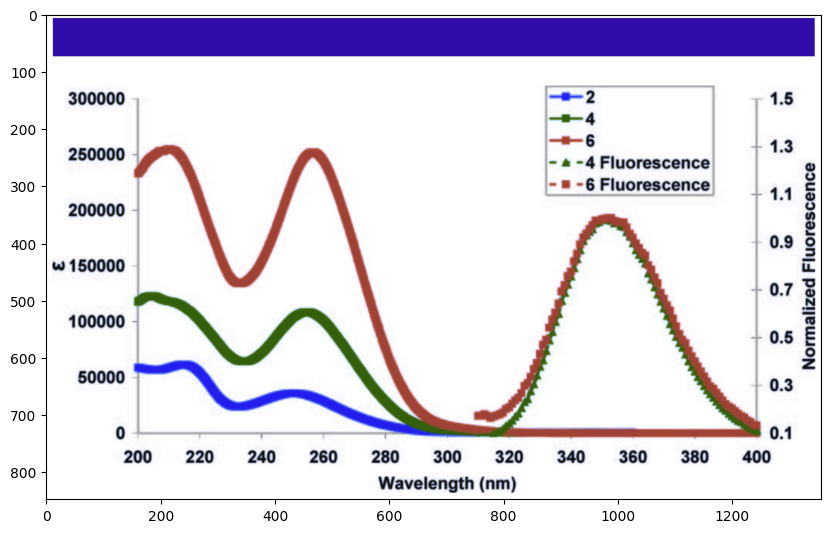

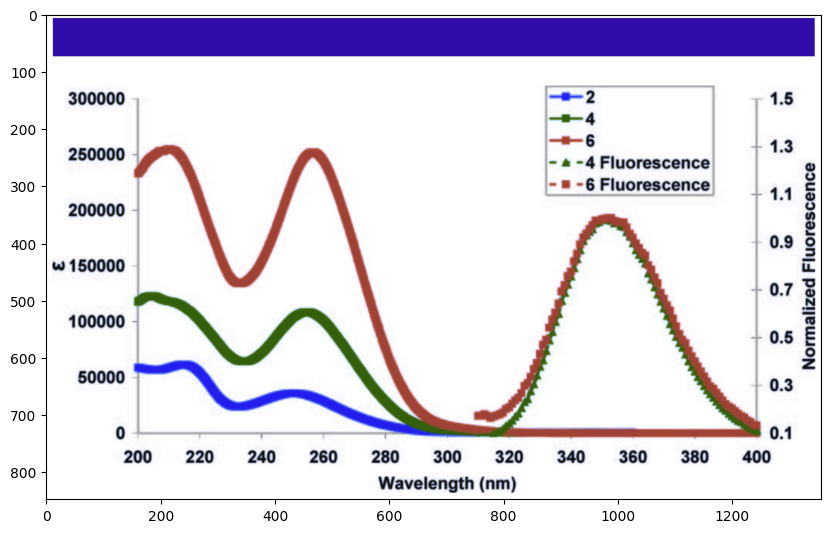

192
-------
[]
-------
[]
gt_num
2014
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2013, 'width': 818, 'height': 1088, 'file_name': 'ol8019605-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Borylation of Sterically Hindered m-Terphenylsa'}, {'id': 2014, 'width': 818, 'height': 1088, 'file_name': 'ol8019605-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Absorbance and emission spectra of dendrons.'}], 'annotations': []}


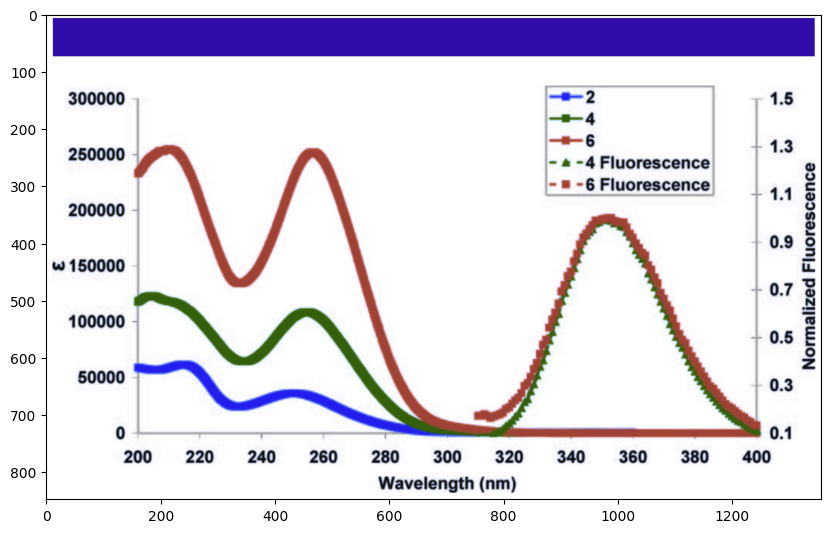

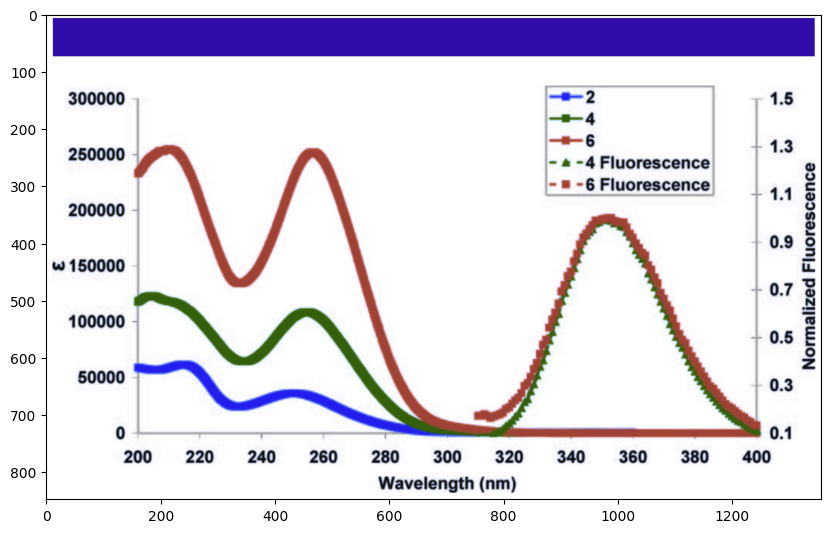

193
-------
[]
gt_num
2018
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2018, 'width': 818, 'height': 1088, 'file_name': 'op800091p-Figure-c6.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 6. Vessel performance showing conversions of 8 to 11 and 12 over multiple batches (note irregular batch scale). '}], 'annotations': []}


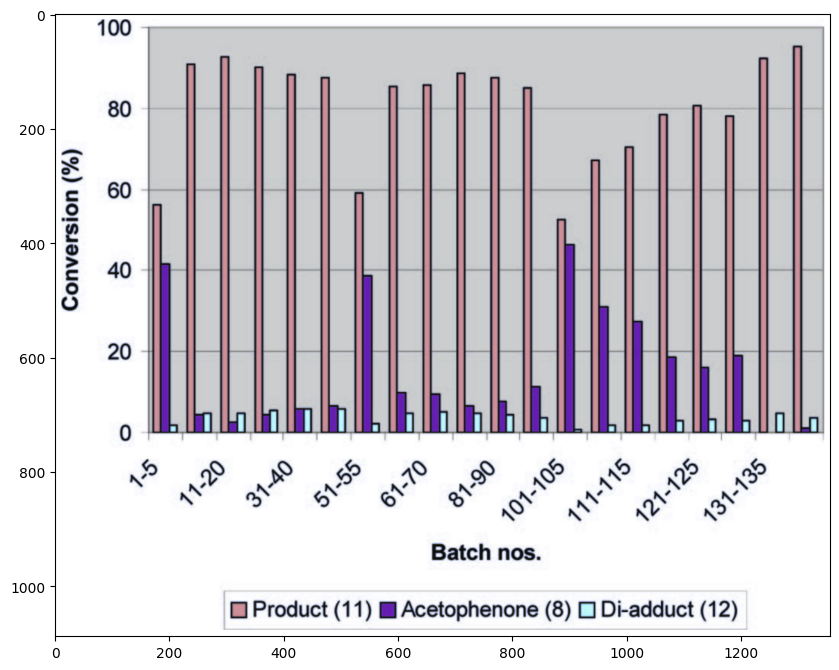

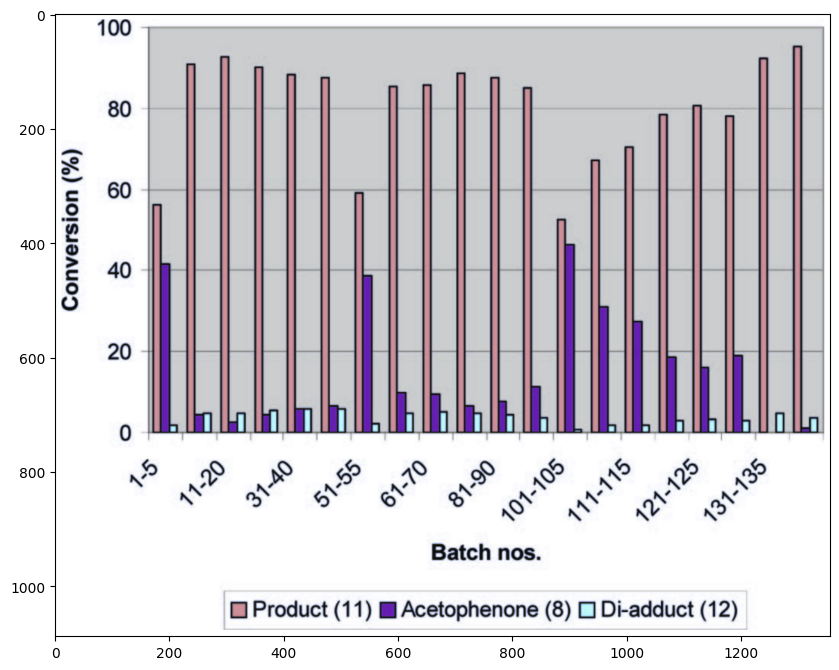

194
-------
[]
-------
[]
gt_num
2041
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2040, 'width': 869, 'height': 1137, 'file_name': 'op5003165-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Structure of amide (1).'}, {'id': 2041, 'width': 869, 'height': 1137, 'file_name': 'op5003165-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Base eﬀects on hydrolysis of 20 in reﬂuxing 2- MeTHF '}], 'annotations': []}


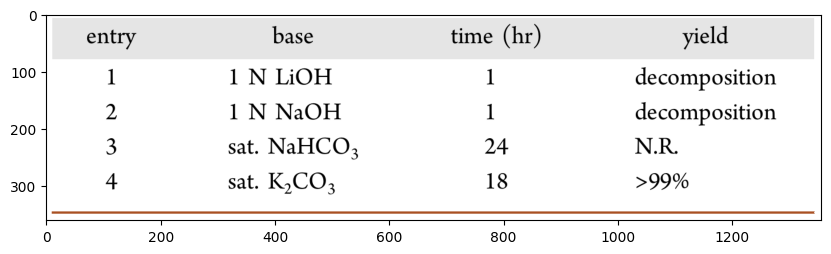

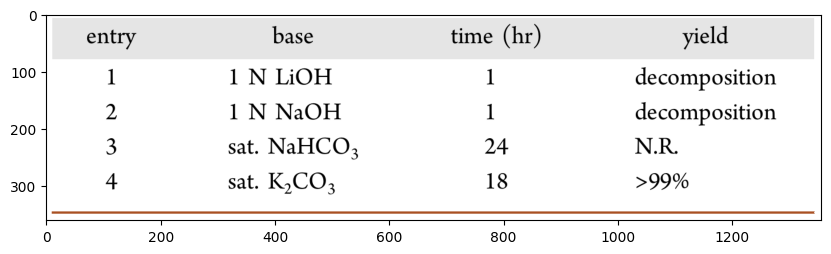

195
-------
[]
-------
[]
gt_num
2041
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2040, 'width': 869, 'height': 1137, 'file_name': 'op5003165-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Structure of amide (1).'}, {'id': 2041, 'width': 869, 'height': 1137, 'file_name': 'op5003165-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Base eﬀects on hydrolysis of 20 in reﬂuxing 2- MeTHF '}], 'annotations': []}


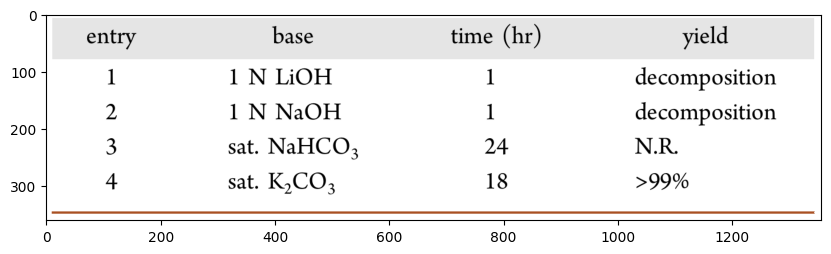

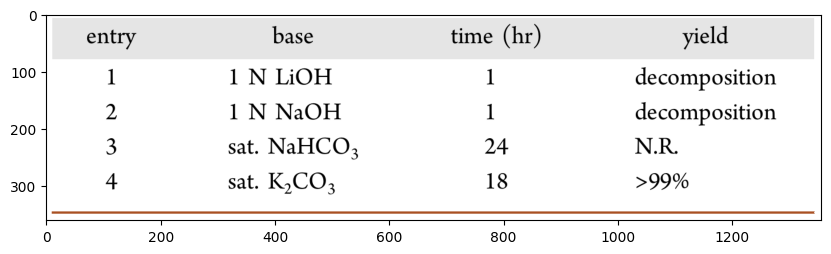

196
-------
[]
-------
[]
gt_num
2044
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2043, 'width': 850, 'height': 1100, 'file_name': 'op025610t-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. 1H NMR spectrum (in CDCl3) of the reaction mixture in atmospheric pressure conditions (∼1 atm). (a) After 32 h under the nitrogen stream; (b) 8 h after switching off the nitrogen stream (experiment 5, Table 1). '}, {'id': 2044, 'width': 850, 'height': 1100, 'file_name': 'op025610t-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. 13C nd 1H NMR Chemical Shift and the J values in 7 and 8'}], 'annotations': []}


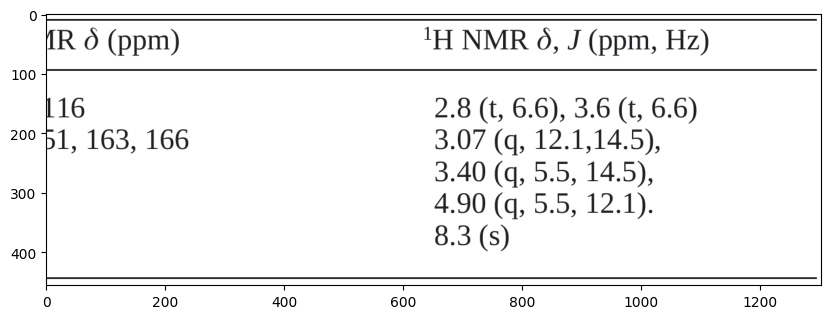

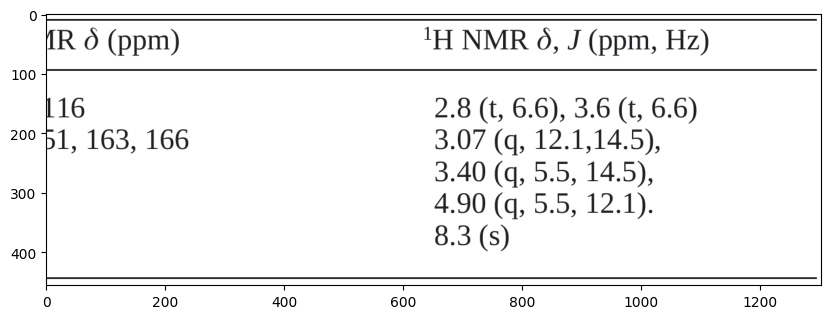

197
-------
[]
-------
[]
gt_num
2044
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2043, 'width': 850, 'height': 1100, 'file_name': 'op025610t-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. 1H NMR spectrum (in CDCl3) of the reaction mixture in atmospheric pressure conditions (∼1 atm). (a) After 32 h under the nitrogen stream; (b) 8 h after switching off the nitrogen stream (experiment 5, Table 1). '}, {'id': 2044, 'width': 850, 'height': 1100, 'file_name': 'op025610t-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. 13C nd 1H NMR Chemical Shift and the J values in 7 and 8'}], 'annotations': []}


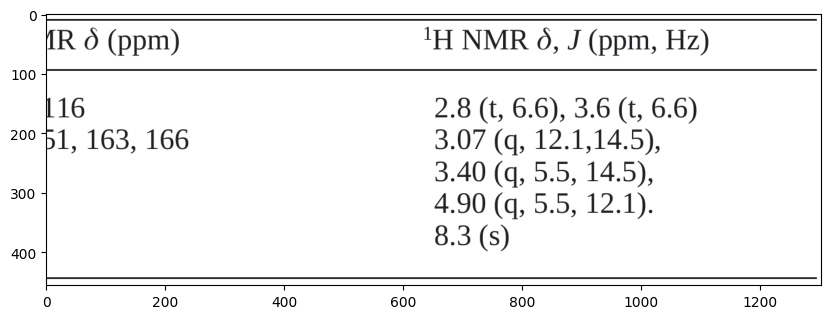

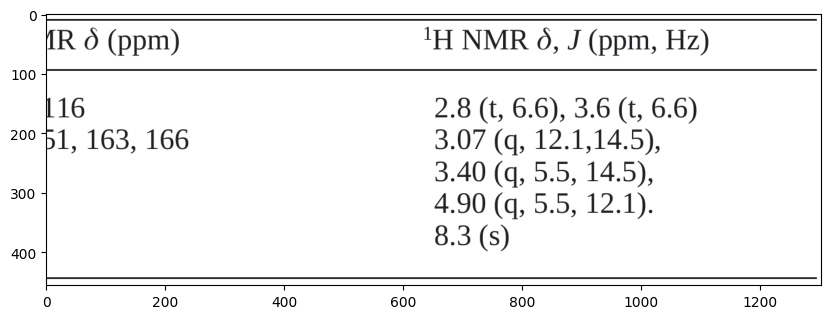

198
-------
[]
-------
[]
gt_num
2057
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2056, 'width': 843, 'height': 1113, 'file_name': 'ol3023177-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Optimization of Reaction of 1a with 2aa'}, {'id': 2057, 'width': 843, 'height': 1113, 'file_name': 'ol3023177-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Conversion of hydroxylamine 2a on varying the relative loading of allylic amine 1a (neat, 80 °C, 2 h). '}], 'annotations': []}


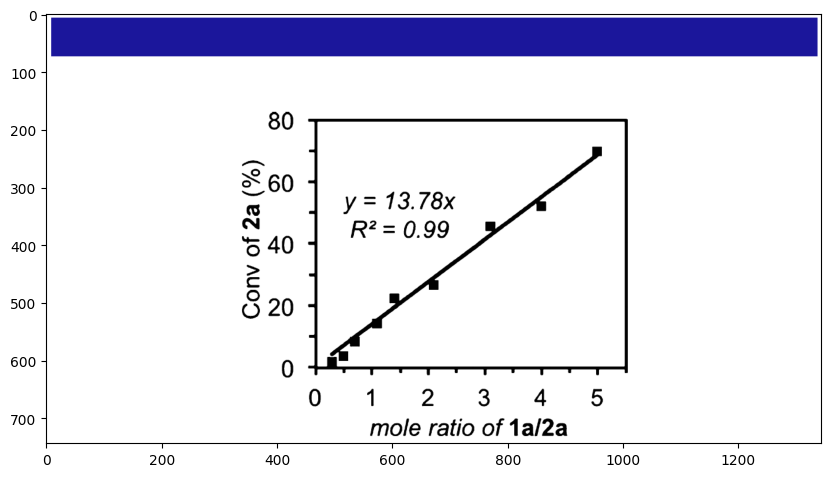

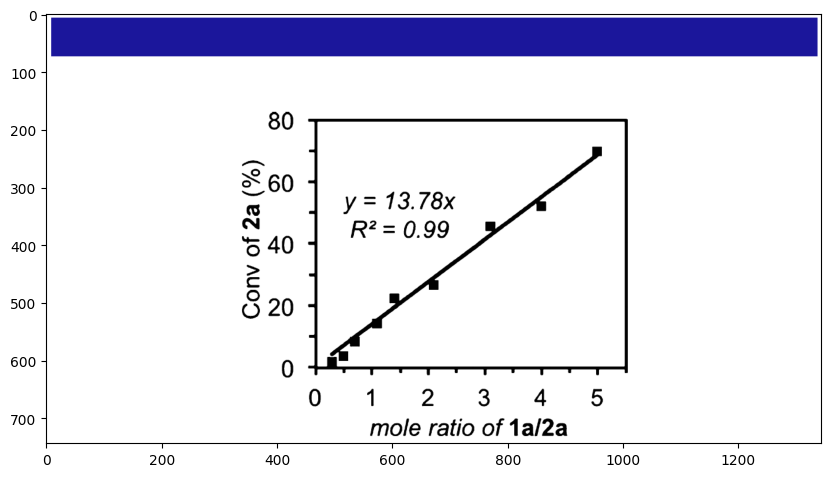

199
-------
[]
-------
[]
gt_num
2057
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2056, 'width': 843, 'height': 1113, 'file_name': 'ol3023177-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Optimization of Reaction of 1a with 2aa'}, {'id': 2057, 'width': 843, 'height': 1113, 'file_name': 'ol3023177-Figure-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Conversion of hydroxylamine 2a on varying the relative loading of allylic amine 1a (neat, 80 °C, 2 h). '}], 'annotations': []}


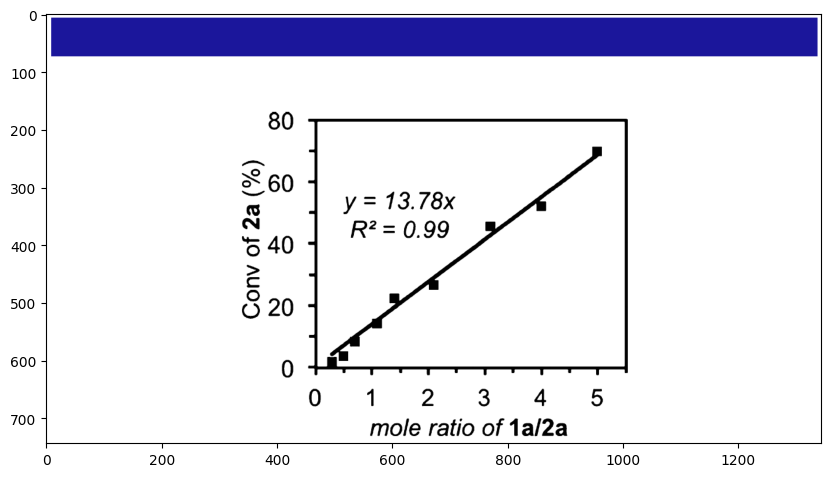

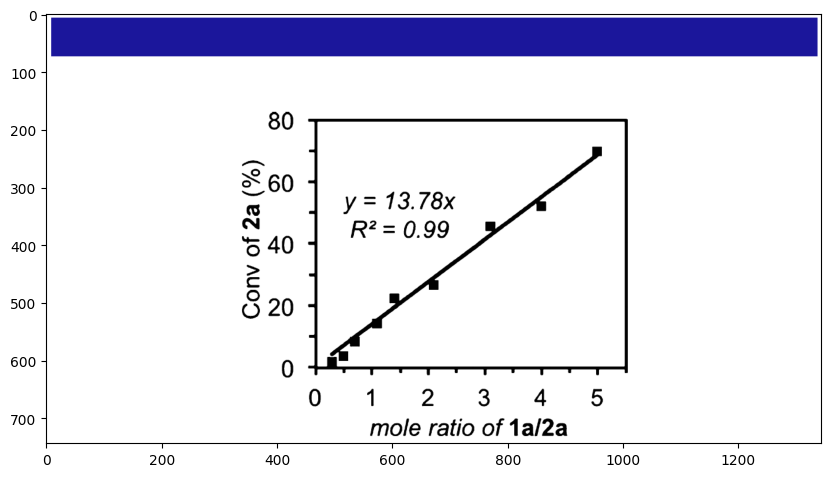

200
-------
[]
-------
[]
gt_num
2060
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2059, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00251-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. A schematic representation of a fully substituted sucrose ester of fatty acid from soybean oil. '}, {'id': 2060, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00251-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Experimental Design Levels for Each Factor and the Reagent Amounts Based on 30 g of Sucrose Soyate (0.1485 molar Unsaturation) Epoxidized during the Optimization Studya '}], 'annotations': []}


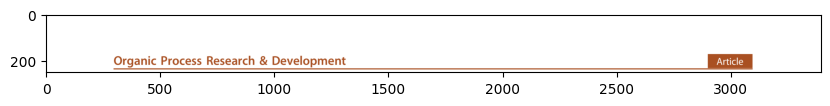

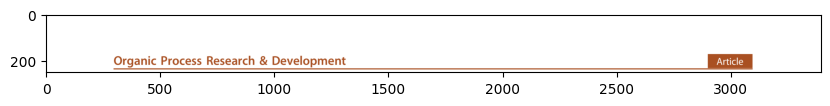

201
-------
[]
-------
[]
gt_num
2060
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2059, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00251-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. A schematic representation of a fully substituted sucrose ester of fatty acid from soybean oil. '}, {'id': 2060, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00251-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Experimental Design Levels for Each Factor and the Reagent Amounts Based on 30 g of Sucrose Soyate (0.1485 molar Unsaturation) Epoxidized during the Optimization Studya '}], 'annotations': []}


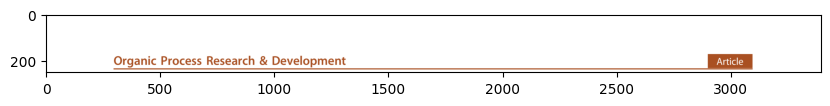

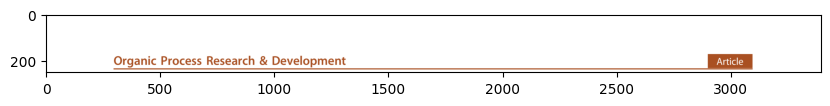

202
-------
[]
-------
[]
gt_num
2078
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2077, 'width': 818, 'height': 1088, 'file_name': 'op9001643-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Biocatalytic reduction of 2,5-hexanedione with substrate-coupled cofactor regeneration.'}, {'id': 2078, 'width': 818, 'height': 1088, 'file_name': 'op9001643-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Process parameters'}], 'annotations': []}


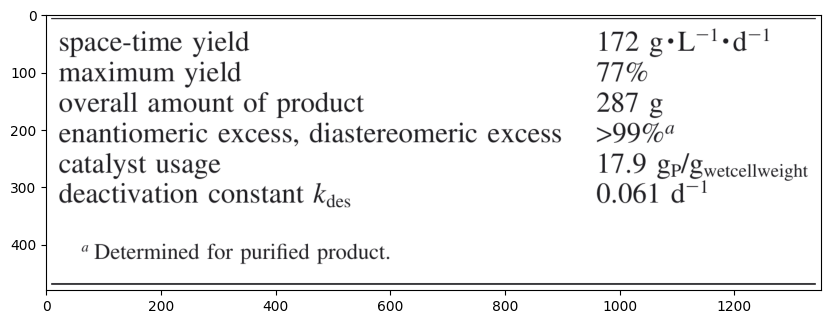

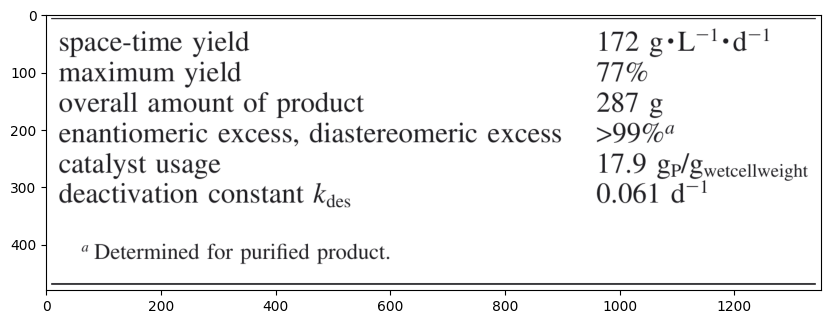

203
-------
[]
-------
[]
gt_num
2078
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2077, 'width': 818, 'height': 1088, 'file_name': 'op9001643-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 1. Biocatalytic reduction of 2,5-hexanedione with substrate-coupled cofactor regeneration.'}, {'id': 2078, 'width': 818, 'height': 1088, 'file_name': 'op9001643-Table-c1.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 1. Process parameters'}], 'annotations': []}


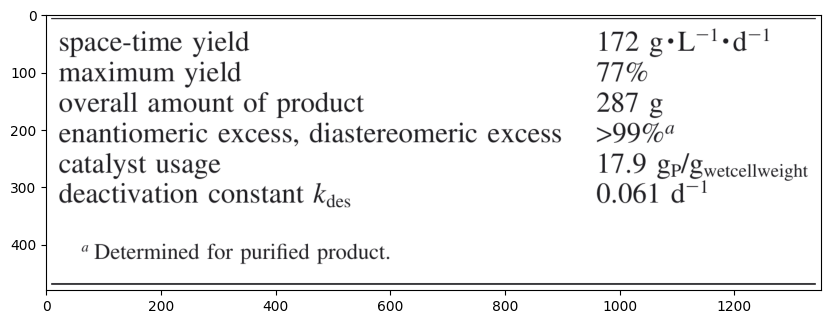

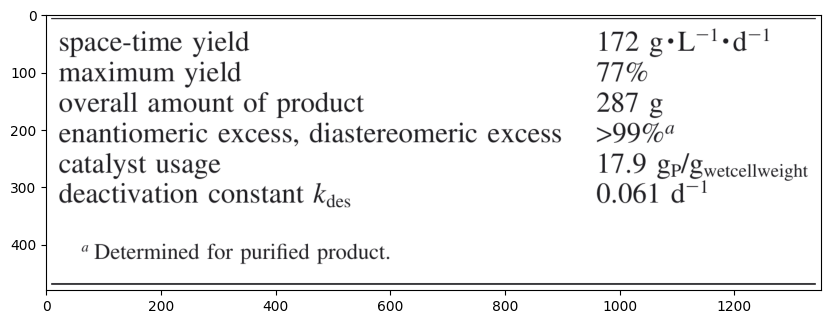

204
-------
[]
-------
[]
gt_num
2110
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2109, 'width': 850, 'height': 1100, 'file_name': 'op0602371-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 3. Plot of concentration of (R,R)-5 in MTBE phase versus time '}, {'id': 2110, 'width': 850, 'height': 1100, 'file_name': 'op0602371-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 3. Change in concentration of (R,R)-5 in MTBE phase versus time '}], 'annotations': []}


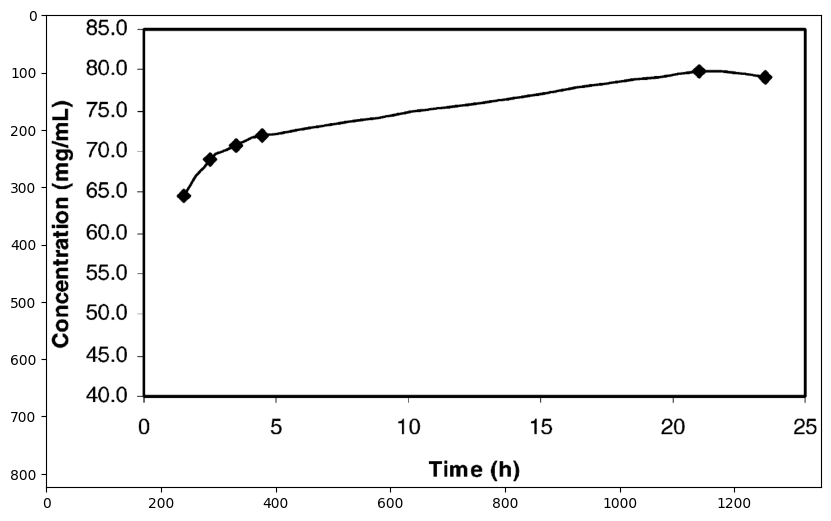

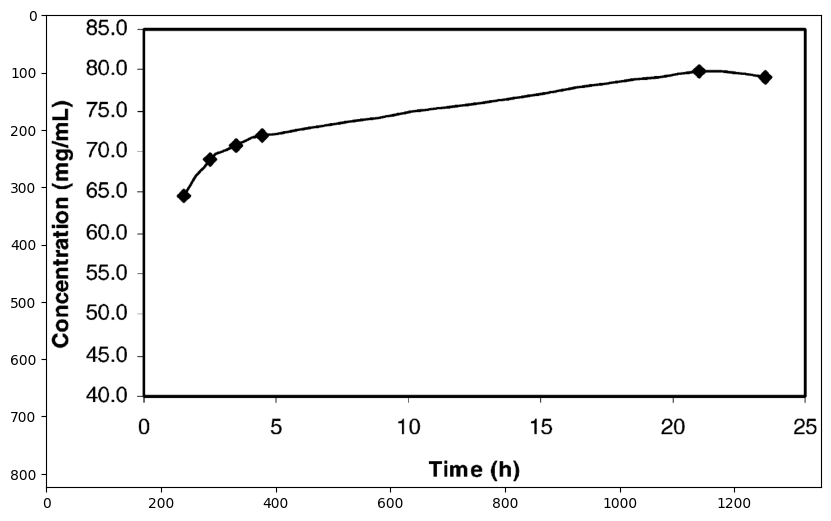

205
-------
[]
-------
[]
gt_num
2110
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2109, 'width': 850, 'height': 1100, 'file_name': 'op0602371-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 3. Plot of concentration of (R,R)-5 in MTBE phase versus time '}, {'id': 2110, 'width': 850, 'height': 1100, 'file_name': 'op0602371-Figure-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 3. Change in concentration of (R,R)-5 in MTBE phase versus time '}], 'annotations': []}


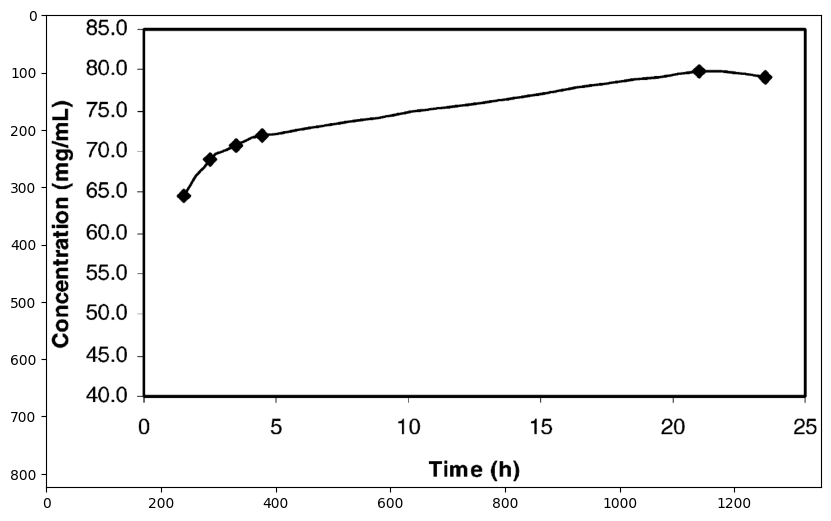

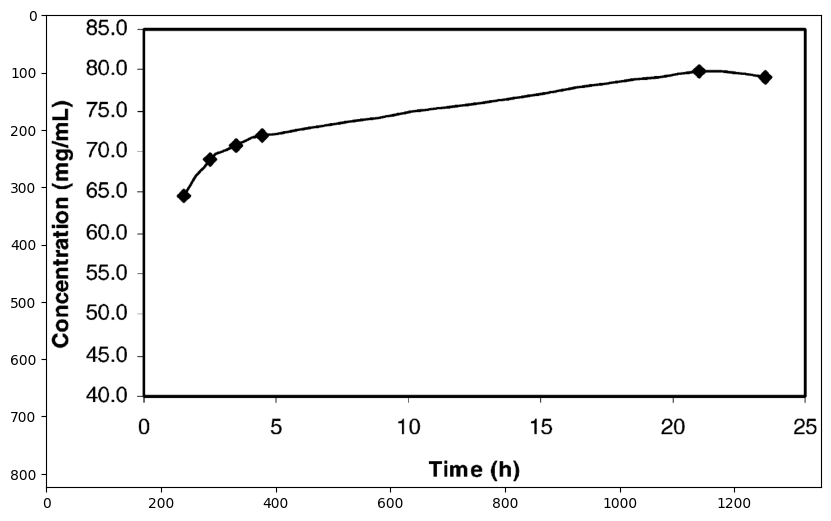

206
-------
[]
gt_num
2154
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2154, 'width': 869, 'height': 1137, 'file_name': 'jo302439t-Table-c3.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 3. Compound 2 in Diethyl Ether-d10. Activation Parameters for Nitrogen Inversion (1) and Interconversion between 2-(exo,exo) and 2-(endo,exo) (2 and 3) '}], 'annotations': []}


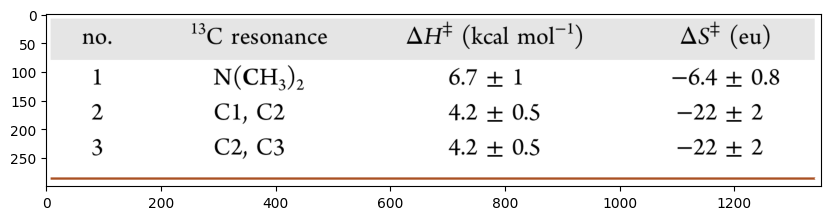

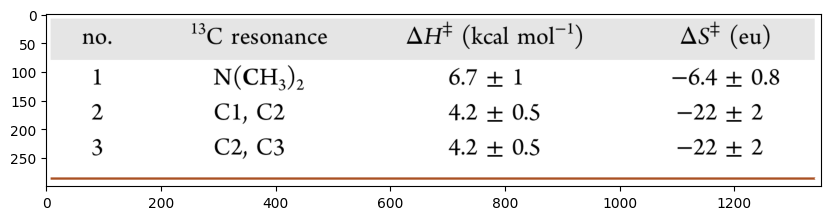

207
-------
[]
-------
[]
gt_num
2203
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2202, 'width': 869, 'height': 1137, 'file_name': 'jo401195c-Table-c5.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 5. KR of the racemic monoacetylated substrates 2, 22, and 23.'}, {'id': 2203, 'width': 869, 'height': 1137, 'file_name': 'jo401195c-Table-c5.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 5. Yields (via GC−MS) of 2, 44, 45, and 46 Obtained in the Competitive Acetylation Reaction'}], 'annotations': []}


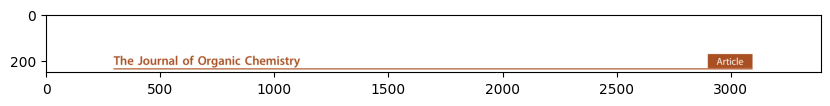

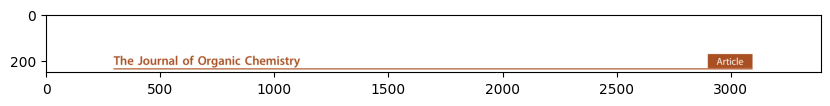

208
-------
[]
-------
[]
gt_num
2203
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2202, 'width': 869, 'height': 1137, 'file_name': 'jo401195c-Table-c5.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 5. KR of the racemic monoacetylated substrates 2, 22, and 23.'}, {'id': 2203, 'width': 869, 'height': 1137, 'file_name': 'jo401195c-Table-c5.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 5. Yields (via GC−MS) of 2, 44, 45, and 46 Obtained in the Competitive Acetylation Reaction'}], 'annotations': []}


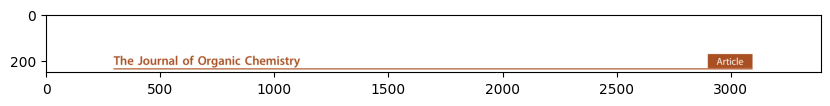

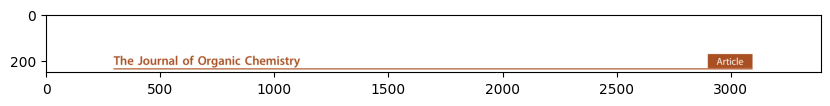

209
-------
[]
gt_num
2210
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2210, 'width': 850, 'height': 1100, 'file_name': 'op060099f-Figure-c4.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 4. Graph of RC1-experiment of mcpba-oxidation of T2542 in CH2Cl2.'}], 'annotations': []}


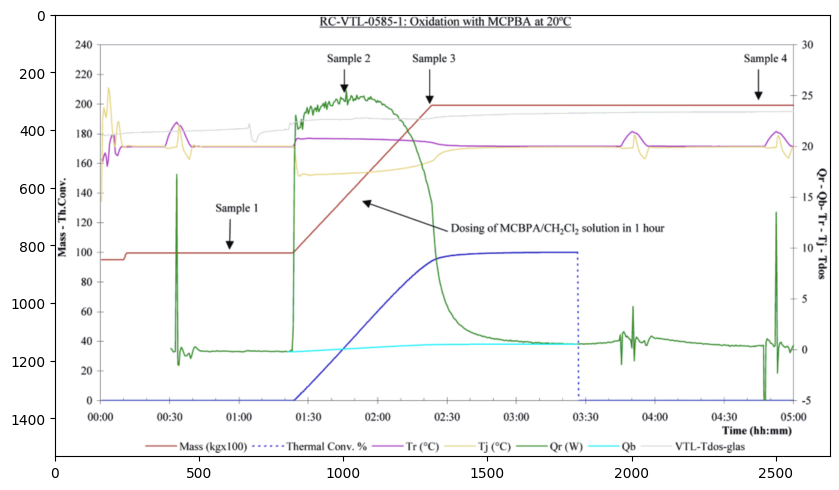

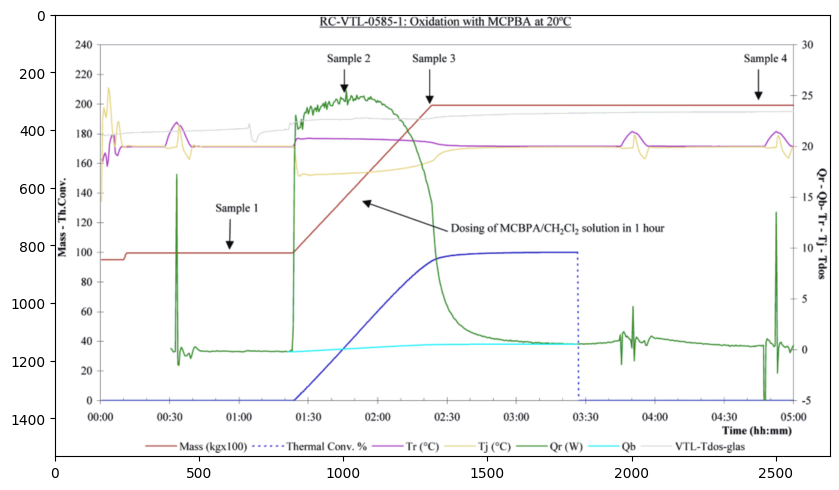

210
-------
[]
gt_num
2229
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2229, 'width': 818, 'height': 1088, 'file_name': 'op900102a-Table-c11.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 11. Pd content of T4 after treatment of 4 g of 10% solution in isopropanol with 100 or 300 mg resin at room temperature for 20 h (initial content 3350 ppm Pd) '}], 'annotations': []}


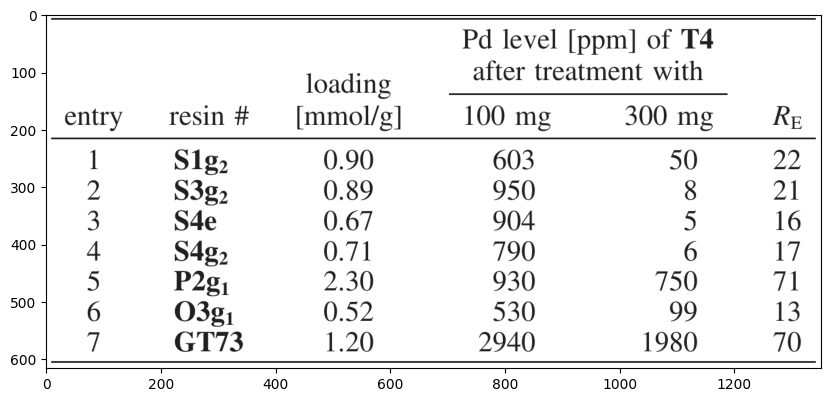

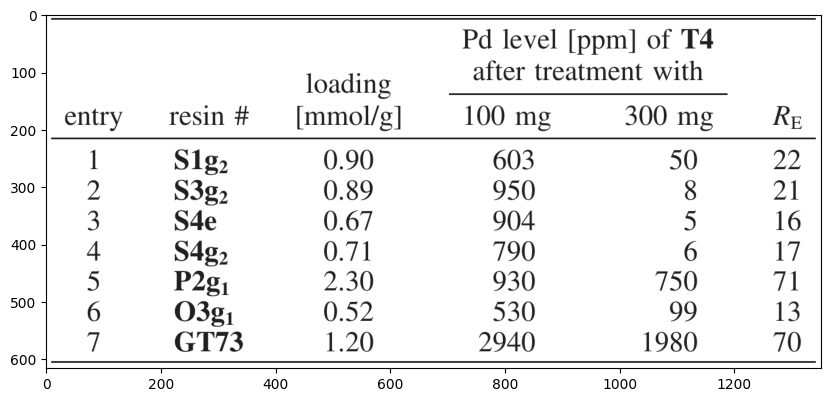

211
-------
[]
-------
[]
gt_num
2234
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2233, 'width': 850, 'height': 1100, 'file_name': 'ol061289d-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. HPLC chromatographs for the reaction of 4 with bromoacetylated Val-OMe. HPLC conditions: Kromasil C18, 0-65% B in A over 30 min, A ) H2O + 0.1% TFA, B ) CH3CN + 0.08% TFA. '}, {'id': 2234, 'width': 850, 'height': 1100, 'file_name': 'ol061289d-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Alkylation Reactions of H-ELFHSIZEKAR-NH2 Peptides 7-9 '}], 'annotations': []}


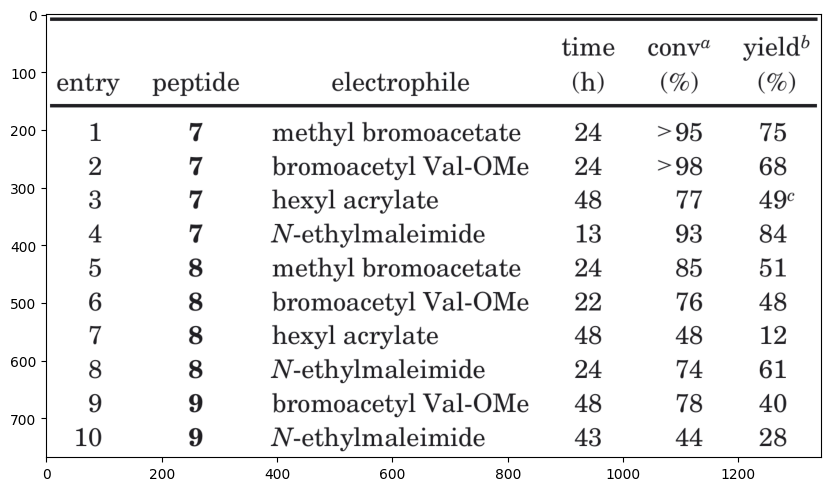

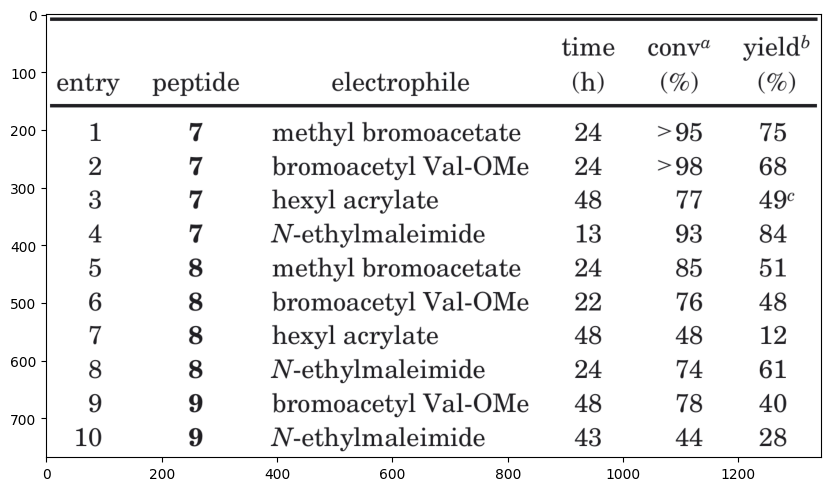

212
-------
[]
-------
[]
gt_num
2234
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2233, 'width': 850, 'height': 1100, 'file_name': 'ol061289d-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. HPLC chromatographs for the reaction of 4 with bromoacetylated Val-OMe. HPLC conditions: Kromasil C18, 0-65% B in A over 30 min, A ) H2O + 0.1% TFA, B ) CH3CN + 0.08% TFA. '}, {'id': 2234, 'width': 850, 'height': 1100, 'file_name': 'ol061289d-Table-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Alkylation Reactions of H-ELFHSIZEKAR-NH2 Peptides 7-9 '}], 'annotations': []}


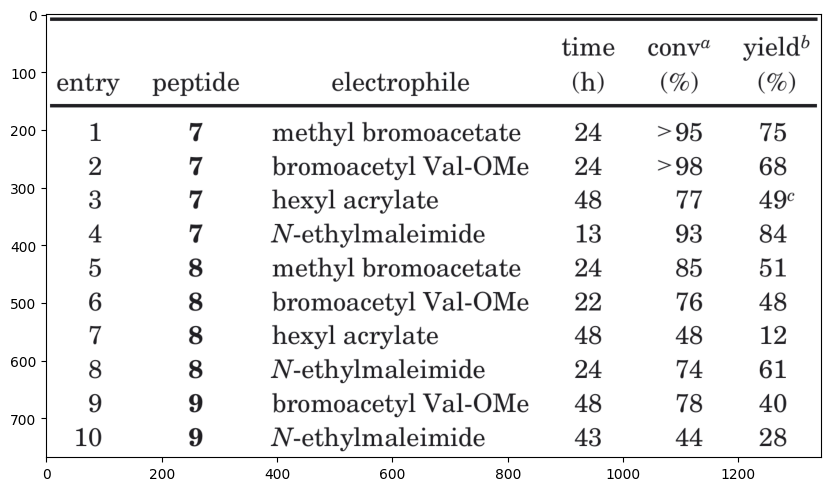

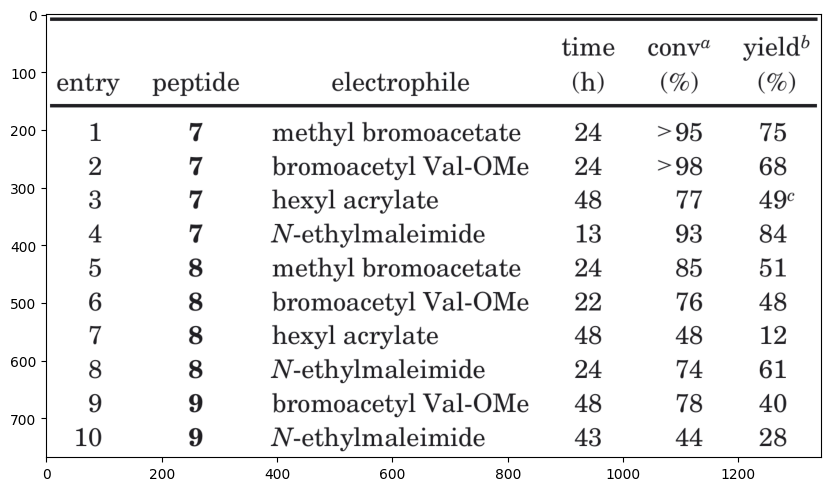

213
-------
[]
gt_num
2236
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2236, 'width': 869, 'height': 1137, 'file_name': 'op400050n-Figure-c6.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 6. Eﬀect of EDTA-2Na dosage on the on the yield of ESO. Conditions: temperature 75 °C; HCOOH(H2O2) to double bond = 8; H2SO4 = 3%; residence time = 6.7 min. '}], 'annotations': []}


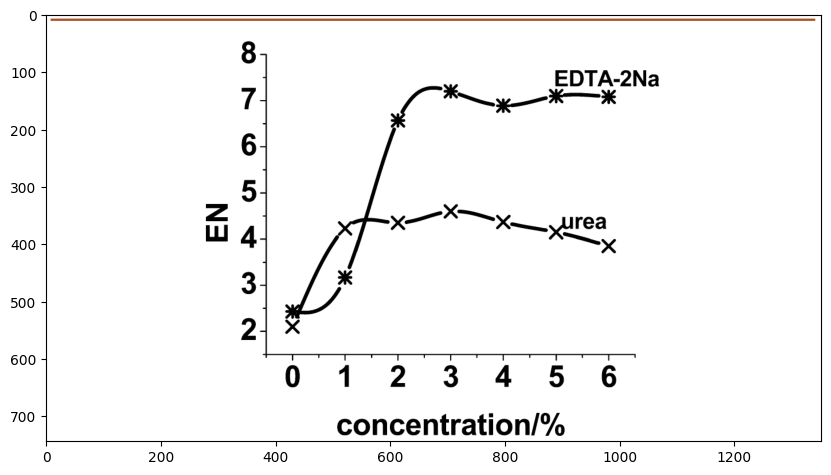

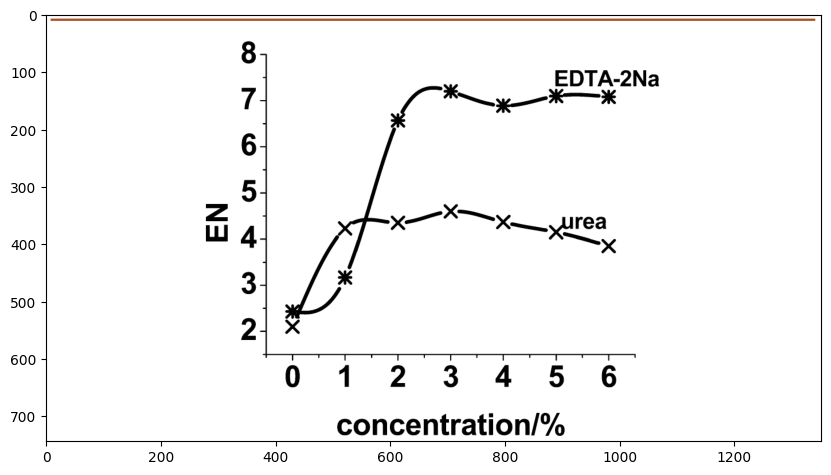

214
-------
[]
-------
[]
gt_num
2241
the ground truth annotations are
{'categories': [{'id': 1, 'name': 'structure', 'supercategory': ''}, {'id': 3, 'name': 'identifier', 'supercategory': ''}], 'images': [{'id': 2240, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00282-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Figure 2. Progress of the P450 hydroxylation of α-isophorone to 4- hydroxy-α-isophorone on 1 L scale with aeration at 20 mL/min. '}, {'id': 2241, 'width': 869, 'height': 1137, 'file_name': 'acs.oprd.5b00282-Figure-c2.png', 'license': 0, 'flickr_url': '', 'coco_url': '', 'data_captured': 0, 'bboxes': [], 'caption': 'Table 2. Cytochrome P450 Concentration and GDH Speciﬁc Activity of the Wild Type BM3 (BM3-WT) '}], 'annotations': []}


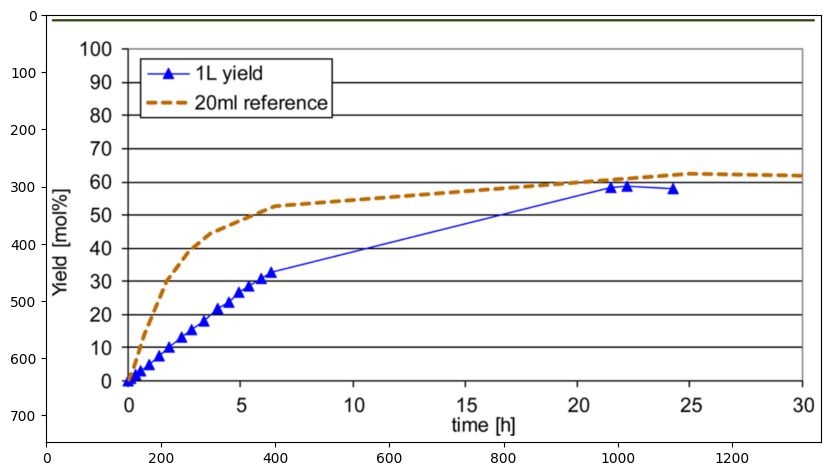

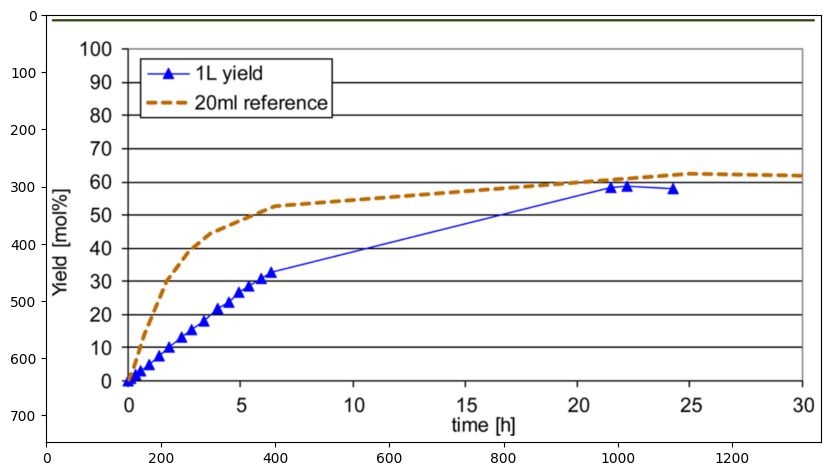

215
0


In [12]:
ap = 0
for i in range(170, 216, 1):
    ap = display_single_image(i, ap)
print(ap)

In [85]:
print(ap)

124.31315459717031


In [86]:
print(ap/170)

0.7312538505715901


-------
[{'image_id': 1648, 'category_id': 3, 'bbox': [4.6643321660830415, 152.7048524262131, 37.98099049524762, 50.01250625312658], 'score': -0.09153727442026138}, {'image_id': 1648, 'category_id': 1, 'bbox': [193.23661830915458, 0.0, 384.4742371185592, 310.7443721860931], 'score': -0.0804392471909523}, {'image_id': 1648, 'category_id': 2, 'bbox': [1287.3556778389195, 148.703851925963, 44.64432216108048, 54.01350675337672], 'score': -0.5128538608551025}, {'image_id': 1648, 'category_id': 1, 'bbox': [764.9504752376188, 0.0, 348.4922461230615, 360.0900450225113], 'score': -0.08164539188146591}, {'image_id': 1648, 'category_id': 2, 'bbox': [323.83791895947974, 318.07953976988495, 95.2856428214107, 46.01150575287645], 'score': -0.43915754556655884}, {'image_id': 1648, 'category_id': 1, 'bbox': [0.0, 0.0, 0.6663331665832916, 364.0910455227614], 'score': -0.3735106289386749}, {'image_id': 1648, 'category_id': 1, 'bbox': [0.0, 0.0, 0.6663331665832916, 146.70335167583795], 'score': -0.3556986

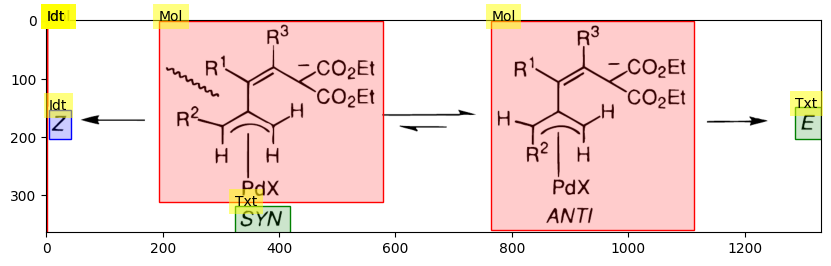

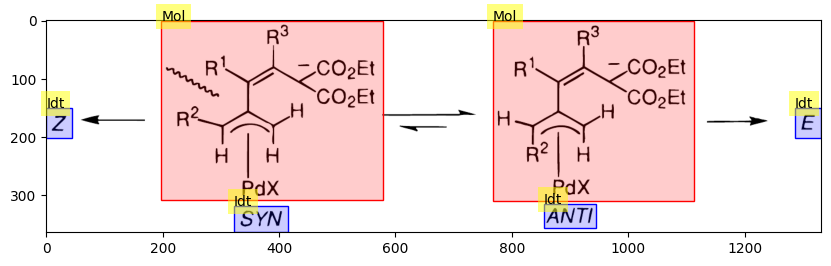

141
-------
[{'image_id': 34, 'category_id': 2, 'bbox': [583.3016508254127, 603.6409945760682, 294.68534267133566, 84.98186068892129], 'score': -0.0853874608874321}, {'image_id': 34, 'category_id': 1, 'bbox': [317.6128064032016, 533.4972365471174, 234.66933466733371, 62.724706698965726], 'score': -0.08135563880205154}, {'image_id': 34, 'category_id': 2, 'bbox': [193.53476738369184, 341.95082039113584, 433.59879939969994, 39.118634285376494], 'score': -0.082189179956913}, {'image_id': 34, 'category_id': 1, 'bbox': [930.5852926463232, 505.844408862627, 314.9154577288644, 100.49442256070863], 'score': -0.08126002550125122}, {'image_id': 34, 'category_id': 2, 'bbox': [353.3526763381691, 649.5042209796131, 160.4922461230615, 39.11863428537636], 'score': -0.08350781351327896}, {'image_id': 34, 'category_id': 2, 'bbox': [1107.935967983992, 57.32903300443107, 59.34167083541769, 46.537685615361696], 'score': -0.09074056148529053}, {'image_id': 34, 'category_id': 2, 'bbox': [193.53476738369184, 

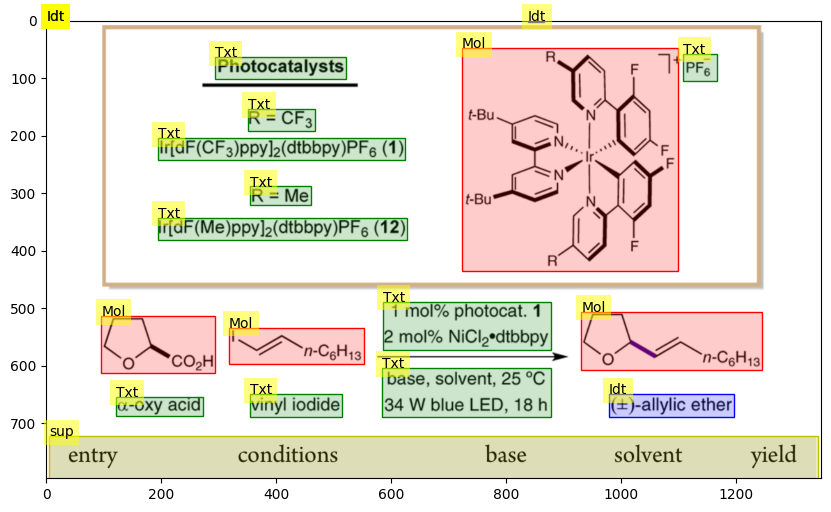

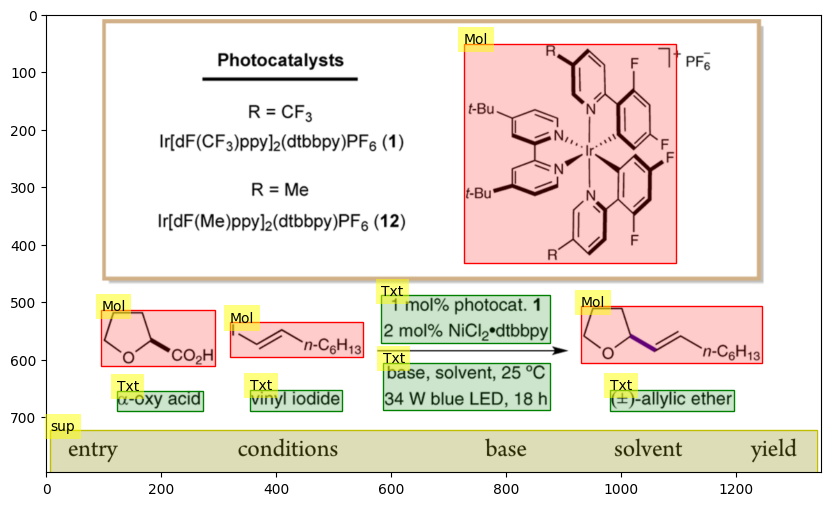

0


0.7356105610561057

In [87]:
evaluate_single_image(141, 0)
evaluate_single_image(0,0)

-------
[{'image_id': 1514, 'category_id': 1, 'bbox': [1623.0195097548774, 696.1370407425935, 280.9804902451225, 234.26773190516838], 'score': -0.08159825950860977}, {'image_id': 1514, 'category_id': 1, 'bbox': [0.0, 1277.997139092422, 283.83791895947974, 284.74004812863967], 'score': -0.0819796472787857}, {'image_id': 1514, 'category_id': 2, 'bbox': [797.2226113056528, 385.6846805755819, 173.3506753376689, 109.51540312639973], 'score': -0.08009732514619827}, {'image_id': 1514, 'category_id': 2, 'bbox': [1530.6293146573287, 1556.0710322481502, 109.53476738369169, 59.9953947562015], 'score': -0.08366845548152924}, {'image_id': 1514, 'category_id': 1, 'bbox': [1042.9614807403702, 1502.7417924648598, 280.0280140070035, 242.83850258462581], 'score': -0.08111581951379776}, {'image_id': 1514, 'category_id': 1, 'bbox': [1623.0195097548774, 1289.4248333316987, 266.6933466733366, 219.03080625279947], 'score': -0.08133509010076523}, {'image_id': 1514, 'category_id': 2, 'bbox': [1250.601300650325

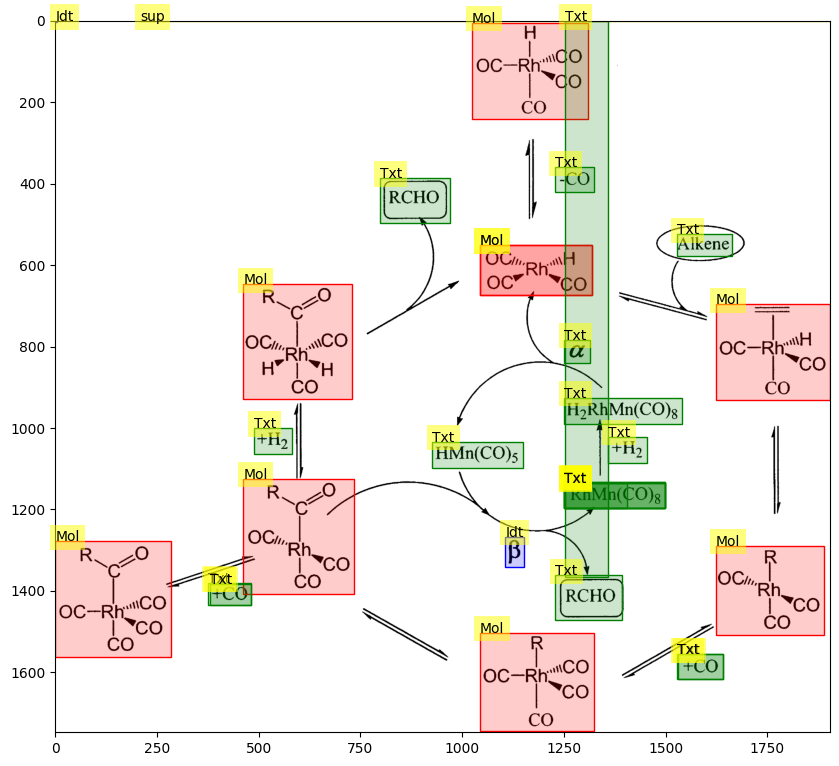

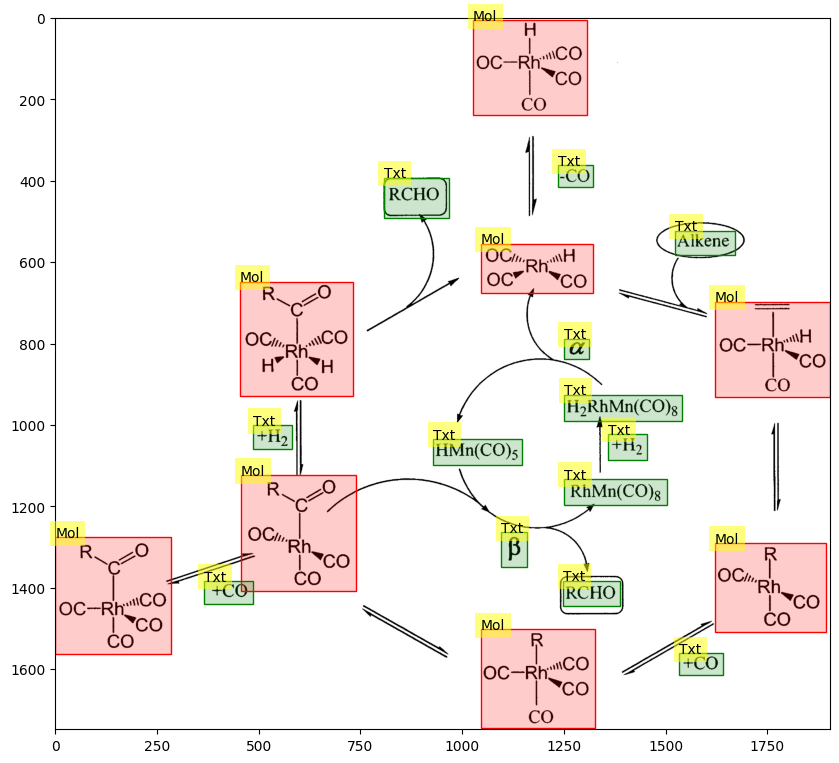

129


0.8806380638063808

In [73]:
evaluate_single_image(129, 0)